<a href="https://colab.research.google.com/github/novcicmilan/PPPO-projekat-IT12-2018/blob/main/Novcic_Milan_IT_12_2018_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**GAN** ili *generative adversarial network* predstavlja model mašinskog učenja u kojem se dve neuronske mreže međusobno takmiče koja će imati bolju predikciju. Dve neuronske mreže koje ulaze u sastav GAN-a su **generator** i **diskriminator**. Generator je konvoluciona neuronska mreža, što znači da kao ulaz može primiti sliku. Konvolucione neuronske mreže različitim aspektima ili objektima na slici dodeljuju težinske vrednosti u odnosu na njihov efekat na sliku. Dodelom ovih težinskih vrednosti, konvoluciona neuronaska mreža je u mogućnosti da međusobno razlikuje dve slike. Diskriminator je dekonvoluciona neuronska mreža, koja radi u suprotnom smeru od konvolucione neuronske mreže tj. radi suprotno od generatora.








Cilj generatora je da veštački proizvede izlaze koji bi mogli da zamene prave podatke, dok je cilj diskriminatora da identifikuje koji izlazi, koje prima, su veštački napravljeni.

In [1]:
# import from drive
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1tKOTjbtdxS-pzw80JHN-2FUiZA7htL7p' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1tKOTjbtdxS-pzw80JHN-2FUiZA7htL7p" -O data.zip && rm -rf /tmp/cookies.txt

--2022-08-27 15:16:43--  https://docs.google.com/uc?export=download&confirm=t&id=1tKOTjbtdxS-pzw80JHN-2FUiZA7htL7p
Resolving docs.google.com (docs.google.com)... 108.177.127.101, 108.177.127.102, 108.177.127.138, ...
Connecting to docs.google.com (docs.google.com)|108.177.127.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/f5613kmfc0odfc7a431cvfrb7pqv5djt/1661613375000/06049624160957438625/*/1tKOTjbtdxS-pzw80JHN-2FUiZA7htL7p?e=download&uuid=b91821d6-5ef9-447b-82e3-b1c266572664 [following]
--2022-08-27 15:16:43--  https://doc-14-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/f5613kmfc0odfc7a431cvfrb7pqv5djt/1661613375000/06049624160957438625/*/1tKOTjbtdxS-pzw80JHN-2FUiZA7htL7p?e=download&uuid=b91821d6-5ef9-447b-82e3-b1c266572664
Resolving doc-14-64-docs.googleusercontent.com (doc-14-64-docs.googleusercontent.com)... 74.125.143.1

Prvi korak prilikom kreiranja GAN-a je identifikacija željenog izlaza i prikupljanje trening podataka za potrebe željenih rezultata. Željeni izlaz ovog projekta je kreiranje veštačkih slika pasa i za potrebe toga prikupljen je dataset koji sadrži preko dvadeset hiljada slika različitih vrsta pasa. U komandi iznad set sa trening podacima dodat je u projekat, dok je u narednoj liniji projekat *unzip*-ovan u željeni folder. 

In [2]:
# unzip downloaded folder
import zipfile
from zipfile import ZipFile
import os

!mkdir '../input'
!unzip data.zip

with ZipFile('all-dogs.zip', 'r') as zipObj:
   zipObj.extractall('./input')

Archive:  data.zip
  inflating: Annotation.zip          
  inflating: all-dogs.zip            


In [3]:
print(os.listdir("/content/input/"))

['all-dogs']


**PyTorch** - *open source* biblioteka za mašinsko učenje koja služi za razvoj i treniranje neuronskih mreža baziranih na *deep learning* modelu. Ova biblioteka koristi dinamičko računanje, koje omogućava veću fleksibilnost prilikom kreiranja kompleksnih arhitektura.
**Tqdm** biblioteka koristi se za kreiranje i vizuelni prikaz napretka, najčešće putem progress bar-a. 
**Matplotlib** je biblioteka za vizuelizaciju podataka i grafički prikaz plolotva.


In [4]:
from __future__ import print_function
import time
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.autograd import Variable
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm_notebook as tqdm

Prikaz slučajnih slika.

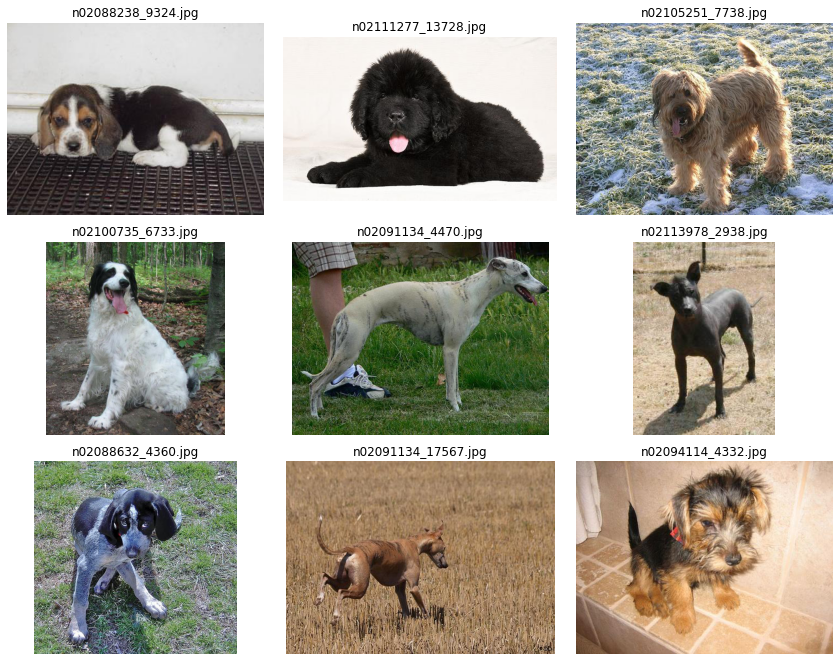

In [5]:
PATH = './input/all-dogs/'
images = os.listdir(PATH)
less_images = images[0:5000:1]

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,10))

for indx, axis in enumerate(axes.flatten()):
    rnd_indx = np.random.randint(0, len(less_images))
    img = plt.imread(PATH + less_images[rnd_indx])
    imgplot = axis.imshow(img)
    axis.set_title(less_images[rnd_indx])
    axis.set_axis_off()
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

Kao i za svaki model, tako i za ovaj model neophodno je pripremiti podatke tako da odgovaraju trenažnom procesu, u ovom slucaju neophodno je prepraviti slike tako da su sve slike istih dimenzija. 

In [6]:
batch_size = 32
batchSize = 64
imageSize = 64

import random
from random import sample

# 64x64 slike!
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('./input/', transform=transform)

dataloader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)

imgs, label = next(iter(dataloader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

In [7]:
batch_size = 32
image_size = 64

random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.RandomHorizontalFlip(p=0.5),
                               transforms.RandomApply(random_transforms, p=0.2),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder('./input/', transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                          batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

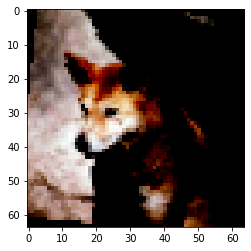

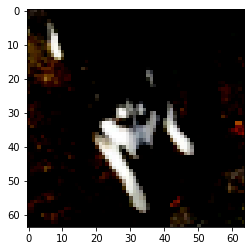

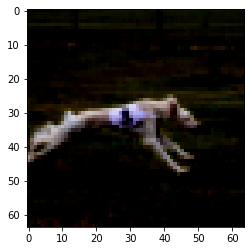

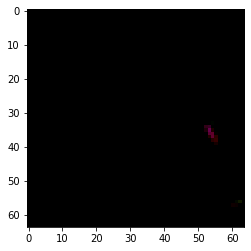

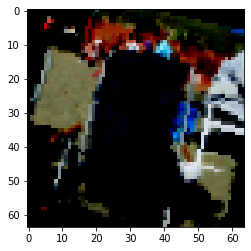

In [8]:
for i in range(5):
    plt.imshow(imgs[i])
    plt.show()

In [9]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

Definisanje neuronske mreže generatora zaduženog za generisanje veštačkih slika na osnovu trening podataka, nakon treniranja modela.

In [10]:
# Definisanje generatora 
class G(nn.Module):
    def __init__(self):
        super(G, self).__init__()
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.ReLU(True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output

# Kreiranje generatora 
netG = G()
netG.apply(weights_init)

G(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

Definisanje neuronske mreže diskriminatora zaduženog za identifikovanje veštački kreiranih slika od strane generatora i njihovo razlikovanje od pravih podataka tj. slika unešenih u projekat. 

In [11]:
# Definisanje diskriminatora
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output.view(-1)
    
    
# Kreiranje diskriminatora
netD = D()
netD.apply(weights_init)

D(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

In [12]:
class Generator(nn.Module):
    def __init__(self, nz=128, channels=3):
        super(Generator, self).__init__()
        
        self.nz = nz
        self.channels = channels
        
        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0):
            block = [
                nn.ConvTranspose2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False),
                nn.BatchNorm2d(n_output),
                nn.ReLU(inplace=True),
            ]
            return block

        self.model = nn.Sequential(
            *convlayer(self.nz, 1024, 4, 1, 0), 
            *convlayer(1024, 512, 4, 2, 1),
            *convlayer(512, 256, 4, 2, 1),
            *convlayer(256, 128, 4, 2, 1),
            *convlayer(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, self.channels, 3, 1, 1),
            nn.Tanh()
        )

    def forward(self, z):
        z = z.view(-1, self.nz, 1, 1)
        img = self.model(z)
        return img

    
class Discriminator(nn.Module):
    def __init__(self, channels=3):
        super(Discriminator, self).__init__()
        
        self.channels = channels

        def convlayer(n_input, n_output, k_size=4, stride=2, padding=0, bn=False):
            block = [nn.Conv2d(n_input, n_output, kernel_size=k_size, stride=stride, padding=padding, bias=False)]
            if bn:
                block.append(nn.BatchNorm2d(n_output))
            block.append(nn.LeakyReLU(0.2, inplace=True))
            return block

        self.model = nn.Sequential(
            *convlayer(self.channels, 32, 4, 2, 1),
            *convlayer(32, 64, 4, 2, 1),
            *convlayer(64, 128, 4, 2, 1, bn=True),
            *convlayer(128, 256, 4, 2, 1, bn=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),  
        )

    def forward(self, imgs):
        logits = self.model(imgs)
        out = torch.sigmoid(logits)
    
        return out.view(-1, 1)

In [13]:
!mkdir results
!ls

all-dogs.zip  Annotation.zip  data.zip	input  results	sample_data


U sledećem koraku neophodno je odrediti težinske parametre za treniranje modela 

In [14]:
EPOCH = 3
LR = 0.0002
criterion = nn.BCELoss()
optimizerD = optim.Adam(netD.parameters(), lr=LR, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR, betas=(0.5, 0.999))

In [15]:
for epoch in range(EPOCH):
    for i, data in enumerate(dataloader, 0):
        netD.zero_grad()
        
        real,_ = data
        input = Variable(real)
        target = Variable(torch.ones(input.size()[0]))
        output = netD(input)
        errD_real = criterion(output, target)
        
        noise = Variable(torch.randn(input.size()[0], 100, 1, 1))
        fake = netG(noise)
        target = Variable(torch.zeros(input.size()[0]))
        output = netD(fake.detach())
        errD_fake = criterion(output, target)
        
        errD = errD_real + errD_fake
        errD.backward()
        optimizerD.step()
        
        netG.zero_grad()
        target = Variable(torch.ones(input.size()[0]))
        output = netD(fake)
        errG = criterion(output, target)
        errG.backward()
        optimizerG.step()
        
        print('[%d/%d][%d/%d] Loss_D: %.4f; Loss_G: %.4f' % (epoch, EPOCH, i, len(dataloader), errD.item(), errG.item()))
        if i % 100 == 0:
            vutils.save_image(real, '%s/real_samples.png' % "./results", normalize=True)
            fake = netG(noise)
            vutils.save_image(fake.data, '%s/fake_samples_epoch_%03d.png' % ("./results", epoch), normalize=True)

[0/3][0/644] Loss_D: 1.6724; Loss_G: 6.1757
[0/3][1/644] Loss_D: 0.9564; Loss_G: 6.4478
[0/3][2/644] Loss_D: 0.6958; Loss_G: 6.6469
[0/3][3/644] Loss_D: 0.8902; Loss_G: 5.5088
[0/3][4/644] Loss_D: 1.3813; Loss_G: 7.6128
[0/3][5/644] Loss_D: 1.1094; Loss_G: 8.2165
[0/3][6/644] Loss_D: 1.1658; Loss_G: 7.6697
[0/3][7/644] Loss_D: 1.0008; Loss_G: 8.1791
[0/3][8/644] Loss_D: 0.9318; Loss_G: 9.5155
[0/3][9/644] Loss_D: 0.6582; Loss_G: 7.4528
[0/3][10/644] Loss_D: 1.1555; Loss_G: 10.8119
[0/3][11/644] Loss_D: 0.4591; Loss_G: 8.7273
[0/3][12/644] Loss_D: 0.8668; Loss_G: 9.8921
[0/3][13/644] Loss_D: 0.9405; Loss_G: 11.0871
[0/3][14/644] Loss_D: 0.7427; Loss_G: 8.3914
[0/3][15/644] Loss_D: 1.9145; Loss_G: 13.7241
[0/3][16/644] Loss_D: 0.5185; Loss_G: 9.6912
[0/3][17/644] Loss_D: 0.8606; Loss_G: 10.9945
[0/3][18/644] Loss_D: 0.7619; Loss_G: 13.3904
[0/3][19/644] Loss_D: 0.3864; Loss_G: 9.5557
[0/3][20/644] Loss_D: 1.1118; Loss_G: 14.9236
[0/3][21/644] Loss_D: 0.7179; Loss_G: 10.9621
[0/3][22/644]

Definisanje *learning rate*-a i broja epoha prilikom treniranja modela.

In [16]:
batch_size = 32
LR_G = 0.0002
LR_D = 0.0002

beta1 = 0.5
epochs = 100

real_label = 0.9
fake_label = 0
nz = 128

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [17]:
netG = Generator(nz).to(device)
netD = Discriminator().to(device)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))

fixed_noise = torch.randn(25, nz, 1, 1, device=device)

G_losses = []
D_losses = []
epoch_time = []

In [18]:

def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [19]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow(image_array)
        
    plt.show()
    plt.close()

Treniranje modela.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  """


  0%|          | 0/644 [00:00<?, ?it/s]

[1/100][322/644] Loss_D: 0.9015 Loss_G: 2.4372 D(x): 0.5934 D(G(z)): 0.2408 / 0.0714
[1/100][644/644] Loss_D: 1.3460 Loss_G: 2.1157 D(x): 0.5065 D(G(z)): 0.4730 / 0.1199


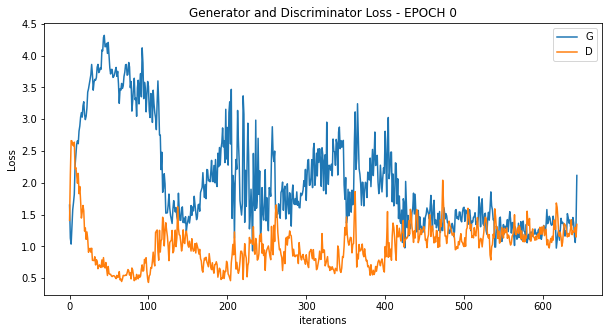

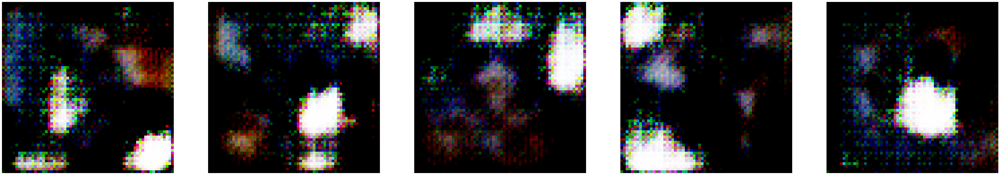

  0%|          | 0/644 [00:00<?, ?it/s]

[2/100][322/644] Loss_D: 1.1599 Loss_G: 1.1438 D(x): 0.5352 D(G(z)): 0.3656 / 0.3041
[2/100][644/644] Loss_D: 2.7820 Loss_G: 1.8791 D(x): 0.2003 D(G(z)): 0.6724 / 0.1741


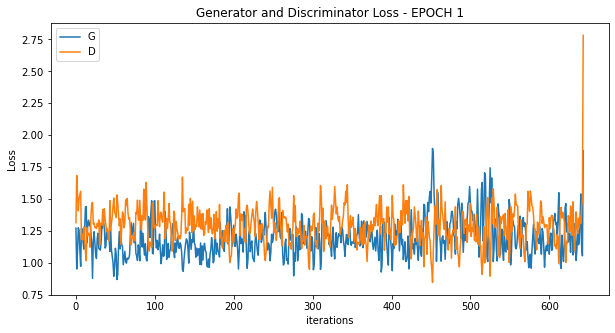

  0%|          | 0/644 [00:00<?, ?it/s]

[3/100][322/644] Loss_D: 1.3592 Loss_G: 0.9645 D(x): 0.3920 D(G(z)): 0.3417 / 0.3713
[3/100][644/644] Loss_D: 1.1544 Loss_G: 1.5758 D(x): 0.3891 D(G(z)): 0.2113 / 0.1949


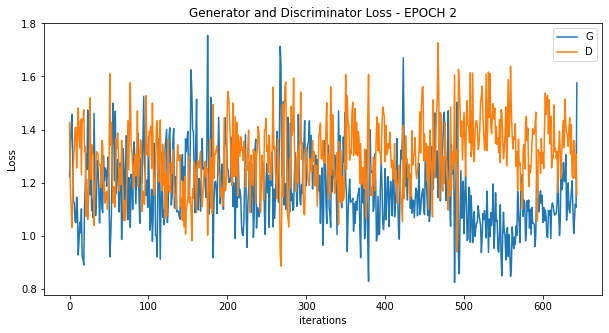

  0%|          | 0/644 [00:00<?, ?it/s]

[4/100][322/644] Loss_D: 1.3900 Loss_G: 0.9776 D(x): 0.4477 D(G(z)): 0.4249 / 0.3642
[4/100][644/644] Loss_D: 1.8447 Loss_G: 0.9188 D(x): 0.2015 D(G(z)): 0.2738 / 0.3836


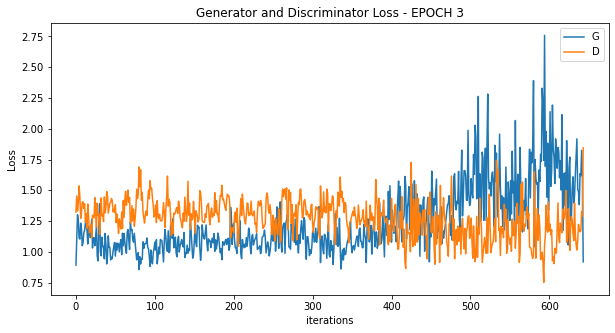

  0%|          | 0/644 [00:00<?, ?it/s]

[5/100][322/644] Loss_D: 1.2875 Loss_G: 1.4130 D(x): 0.4388 D(G(z)): 0.3449 / 0.2342
[5/100][644/644] Loss_D: 1.3983 Loss_G: 1.7644 D(x): 0.4256 D(G(z)): 0.4069 / 0.1459


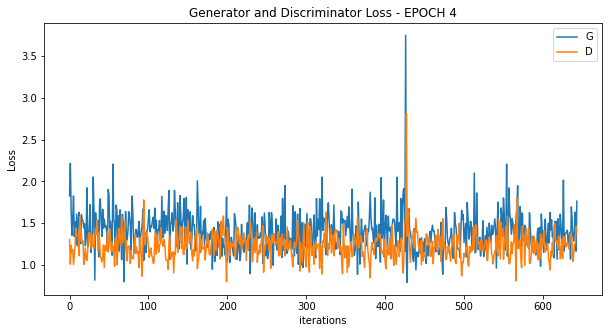

  0%|          | 0/644 [00:00<?, ?it/s]

[6/100][322/644] Loss_D: 1.4533 Loss_G: 1.0501 D(x): 0.5084 D(G(z)): 0.5012 / 0.3510
[6/100][644/644] Loss_D: 1.3065 Loss_G: 3.5360 D(x): 0.5650 D(G(z)): 0.4770 / 0.0199


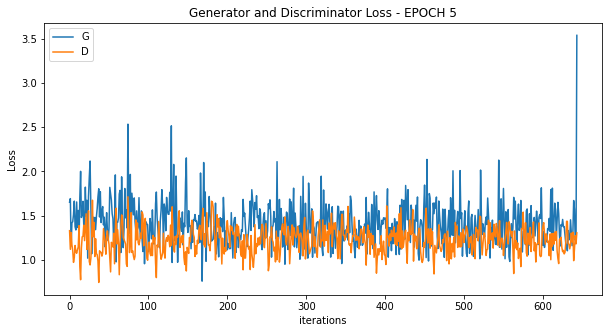

  0%|          | 0/644 [00:00<?, ?it/s]

[7/100][322/644] Loss_D: 1.0604 Loss_G: 1.5234 D(x): 0.5331 D(G(z)): 0.3133 / 0.2055
[7/100][644/644] Loss_D: 0.6940 Loss_G: 2.8951 D(x): 0.7320 D(G(z)): 0.2159 / 0.0439


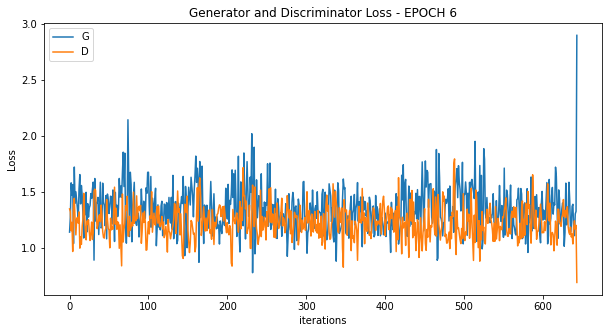

  0%|          | 0/644 [00:00<?, ?it/s]

[8/100][322/644] Loss_D: 1.1592 Loss_G: 1.3006 D(x): 0.6087 D(G(z)): 0.4268 / 0.2635
[8/100][644/644] Loss_D: 0.7581 Loss_G: 2.3865 D(x): 0.5629 D(G(z)): 0.1180 / 0.0840


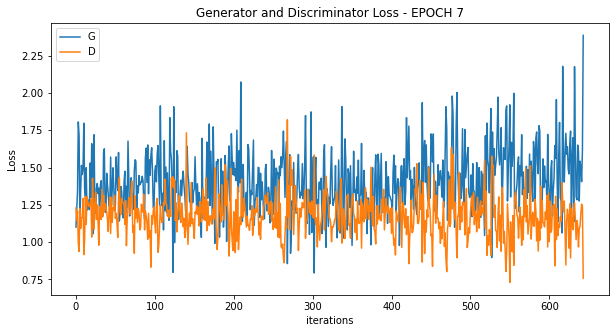

  0%|          | 0/644 [00:00<?, ?it/s]

[9/100][322/644] Loss_D: 1.4387 Loss_G: 1.2712 D(x): 0.4674 D(G(z)): 0.4527 / 0.2654
[9/100][644/644] Loss_D: 1.4824 Loss_G: 1.5220 D(x): 0.2426 D(G(z)): 0.1469 / 0.2151


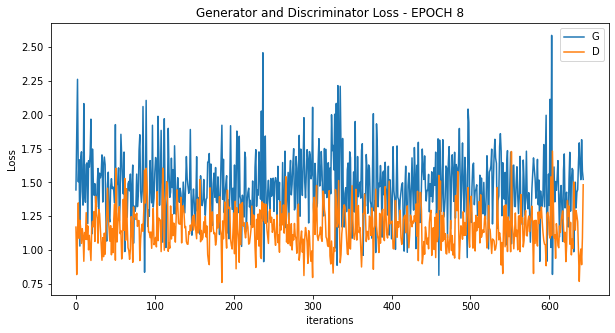

  0%|          | 0/644 [00:00<?, ?it/s]

[10/100][322/644] Loss_D: 0.9512 Loss_G: 1.4783 D(x): 0.5740 D(G(z)): 0.2725 / 0.2137
[10/100][644/644] Loss_D: 0.8260 Loss_G: 2.1464 D(x): 0.5434 D(G(z)): 0.1350 / 0.0959


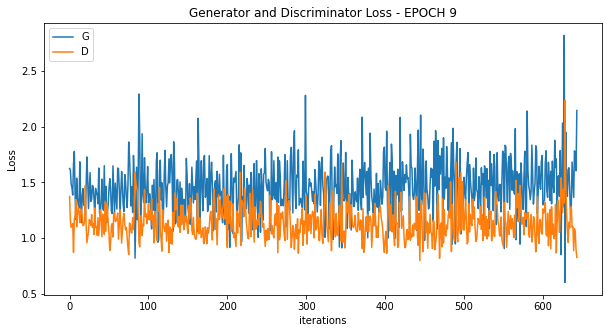

  0%|          | 0/644 [00:00<?, ?it/s]

[11/100][322/644] Loss_D: 1.0738 Loss_G: 1.4328 D(x): 0.6025 D(G(z)): 0.3807 / 0.2359
[11/100][644/644] Loss_D: 0.7544 Loss_G: 3.1498 D(x): 0.7277 D(G(z)): 0.2691 / 0.0318


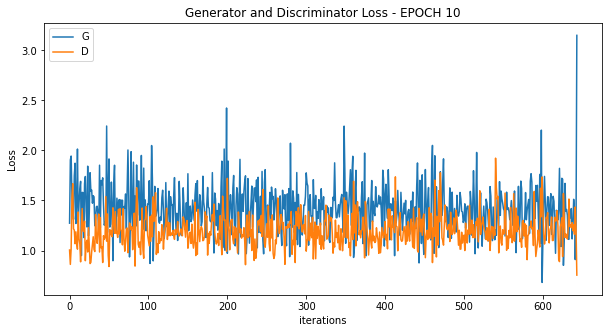

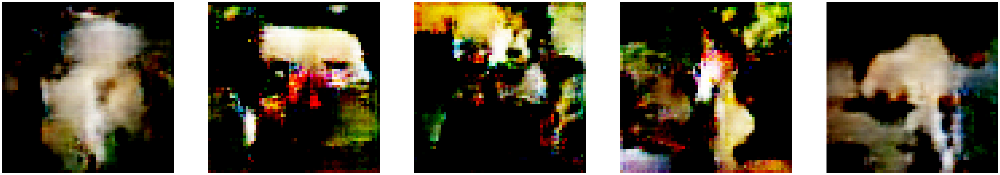

  0%|          | 0/644 [00:00<?, ?it/s]

[12/100][322/644] Loss_D: 1.0060 Loss_G: 1.4965 D(x): 0.6044 D(G(z)): 0.3288 / 0.2315
[12/100][644/644] Loss_D: 1.8000 Loss_G: 1.4110 D(x): 0.1790 D(G(z)): 0.2021 / 0.2289


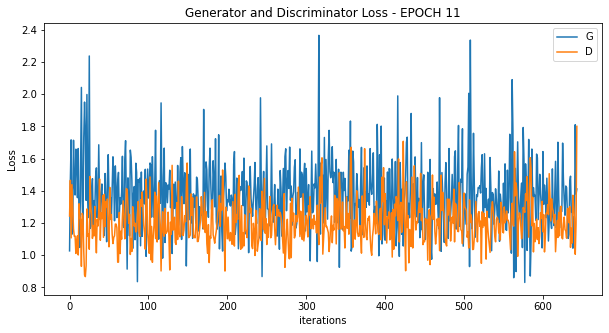

  0%|          | 0/644 [00:00<?, ?it/s]

[13/100][322/644] Loss_D: 1.3820 Loss_G: 1.1779 D(x): 0.4056 D(G(z)): 0.3608 / 0.3085
[13/100][644/644] Loss_D: 1.5264 Loss_G: 2.4785 D(x): 0.3315 D(G(z)): 0.3532 / 0.0656


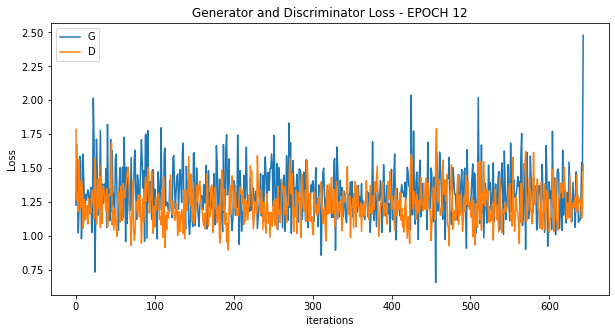

  0%|          | 0/644 [00:00<?, ?it/s]

[14/100][322/644] Loss_D: 1.3907 Loss_G: 1.0439 D(x): 0.3740 D(G(z)): 0.3012 / 0.3581
[14/100][644/644] Loss_D: 1.3080 Loss_G: 1.5889 D(x): 0.3585 D(G(z)): 0.1832 / 0.1778


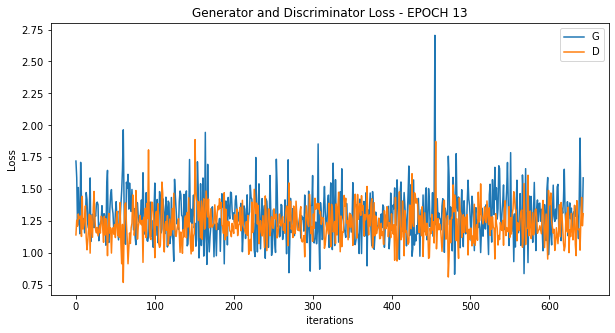

  0%|          | 0/644 [00:00<?, ?it/s]

[15/100][322/644] Loss_D: 1.0603 Loss_G: 1.1260 D(x): 0.4910 D(G(z)): 0.2600 / 0.3094
[15/100][644/644] Loss_D: 0.9982 Loss_G: 2.3612 D(x): 0.6053 D(G(z)): 0.2799 / 0.0734


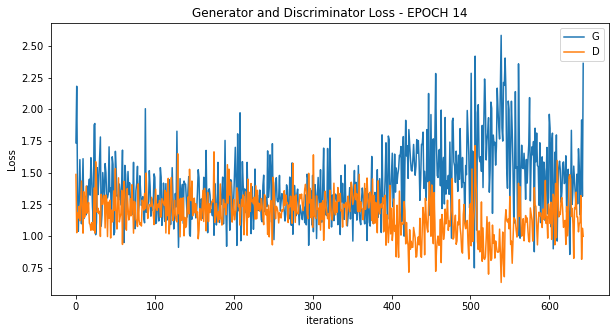

  0%|          | 0/644 [00:00<?, ?it/s]

[16/100][322/644] Loss_D: 1.2280 Loss_G: 1.1360 D(x): 0.5435 D(G(z)): 0.4118 / 0.3158
[16/100][644/644] Loss_D: 1.5033 Loss_G: 2.4375 D(x): 0.3502 D(G(z)): 0.3538 / 0.0814


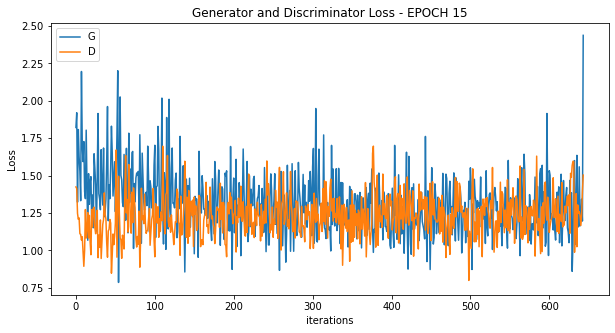

  0%|          | 0/644 [00:00<?, ?it/s]

[17/100][322/644] Loss_D: 1.3548 Loss_G: 1.4357 D(x): 0.5411 D(G(z)): 0.4723 / 0.2327
[17/100][644/644] Loss_D: 1.1383 Loss_G: 2.1696 D(x): 0.4050 D(G(z)): 0.2347 / 0.0994


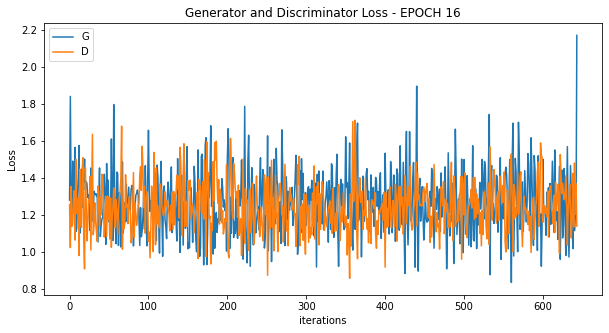

  0%|          | 0/644 [00:00<?, ?it/s]

[18/100][322/644] Loss_D: 1.0704 Loss_G: 1.6893 D(x): 0.6547 D(G(z)): 0.4127 / 0.1702
[18/100][644/644] Loss_D: 1.3786 Loss_G: 2.9791 D(x): 0.4422 D(G(z)): 0.4265 / 0.0424


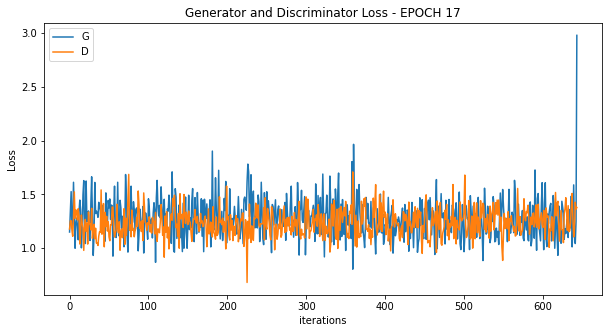

  0%|          | 0/644 [00:00<?, ?it/s]

[19/100][322/644] Loss_D: 1.3746 Loss_G: 1.1859 D(x): 0.5111 D(G(z)): 0.4623 / 0.2947
[19/100][644/644] Loss_D: 1.0912 Loss_G: 2.4596 D(x): 0.4247 D(G(z)): 0.2245 / 0.0669


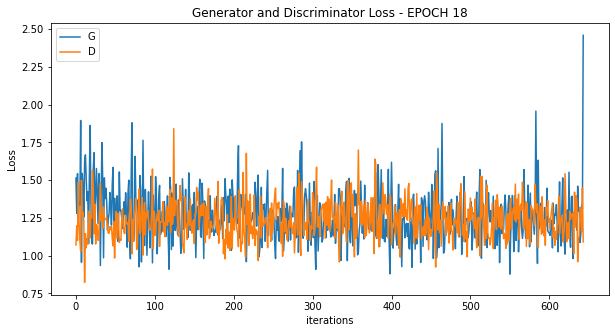

  0%|          | 0/644 [00:00<?, ?it/s]

[20/100][322/644] Loss_D: 1.0505 Loss_G: 1.4691 D(x): 0.5539 D(G(z)): 0.3283 / 0.2095
[20/100][644/644] Loss_D: 1.2430 Loss_G: 2.9951 D(x): 0.4245 D(G(z)): 0.3284 / 0.0618


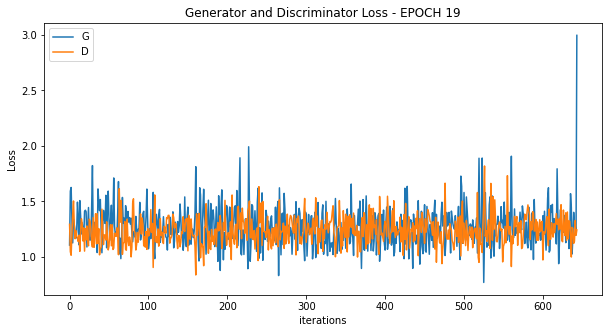

  0%|          | 0/644 [00:00<?, ?it/s]

[21/100][322/644] Loss_D: 1.0982 Loss_G: 1.3835 D(x): 0.6437 D(G(z)): 0.4045 / 0.2396
[21/100][644/644] Loss_D: 1.0427 Loss_G: 3.3759 D(x): 0.5815 D(G(z)): 0.3348 / 0.0427


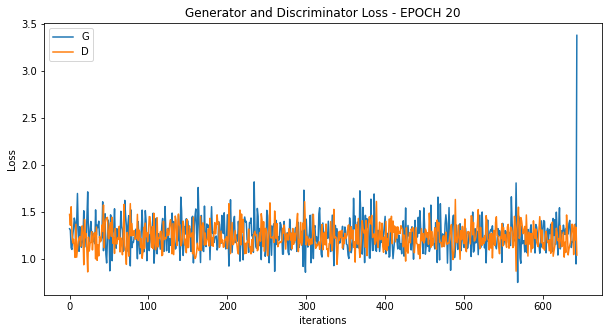

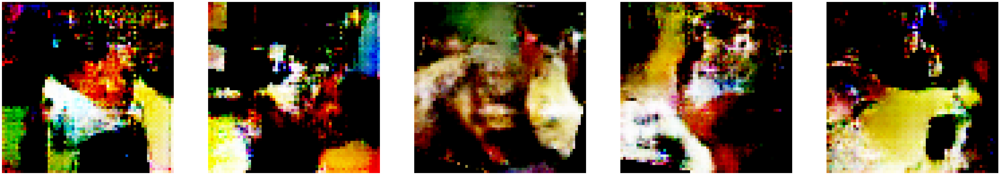

  0%|          | 0/644 [00:00<?, ?it/s]

[22/100][322/644] Loss_D: 1.2436 Loss_G: 1.1224 D(x): 0.4294 D(G(z)): 0.2956 / 0.3119
[22/100][644/644] Loss_D: 1.7003 Loss_G: 1.7772 D(x): 0.2237 D(G(z)): 0.2130 / 0.1625


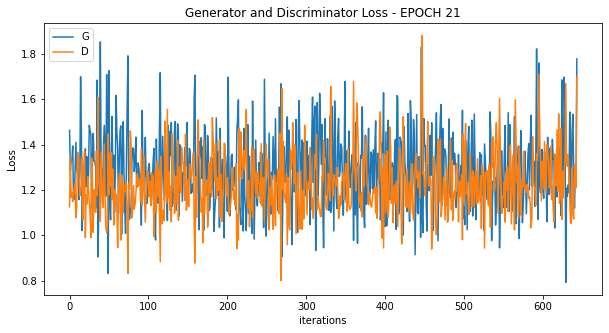

  0%|          | 0/644 [00:00<?, ?it/s]

[23/100][322/644] Loss_D: 1.3171 Loss_G: 1.4405 D(x): 0.5793 D(G(z)): 0.4678 / 0.2381
[23/100][644/644] Loss_D: 1.2561 Loss_G: 2.4056 D(x): 0.3504 D(G(z)): 0.1689 / 0.0756


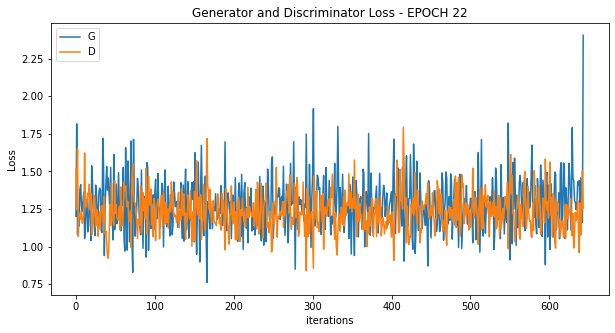

  0%|          | 0/644 [00:00<?, ?it/s]

[24/100][322/644] Loss_D: 1.1045 Loss_G: 1.3374 D(x): 0.6413 D(G(z)): 0.4239 / 0.2491
[24/100][644/644] Loss_D: 1.3985 Loss_G: 2.4844 D(x): 0.4141 D(G(z)): 0.3448 / 0.0701


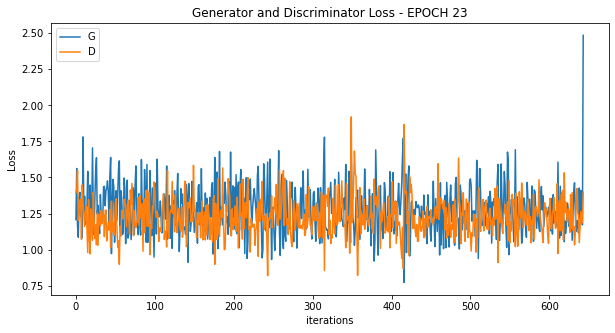

  0%|          | 0/644 [00:00<?, ?it/s]

[25/100][322/644] Loss_D: 1.3313 Loss_G: 1.1503 D(x): 0.3765 D(G(z)): 0.2651 / 0.3150
[25/100][644/644] Loss_D: 0.8426 Loss_G: 2.7675 D(x): 0.6192 D(G(z)): 0.2617 / 0.0509


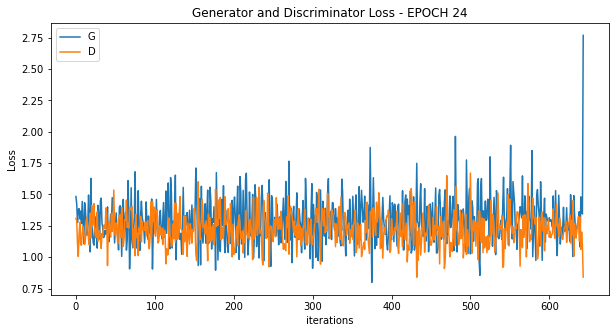

  0%|          | 0/644 [00:00<?, ?it/s]

[26/100][322/644] Loss_D: 1.0356 Loss_G: 1.4424 D(x): 0.6247 D(G(z)): 0.3661 / 0.2247
[26/100][644/644] Loss_D: 1.6186 Loss_G: 1.5552 D(x): 0.3152 D(G(z)): 0.2992 / 0.1867


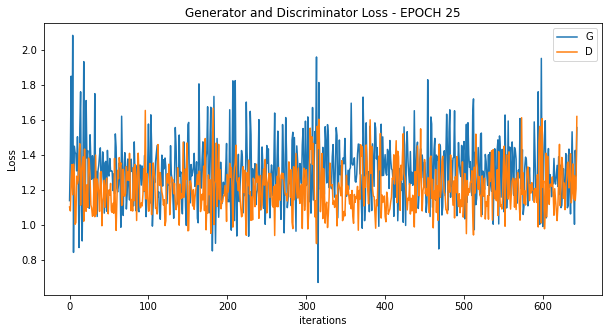

  0%|          | 0/644 [00:00<?, ?it/s]

[27/100][322/644] Loss_D: 1.3595 Loss_G: 1.1247 D(x): 0.5650 D(G(z)): 0.4979 / 0.3186
[27/100][644/644] Loss_D: 1.3089 Loss_G: 4.0481 D(x): 0.5686 D(G(z)): 0.5068 / 0.0192


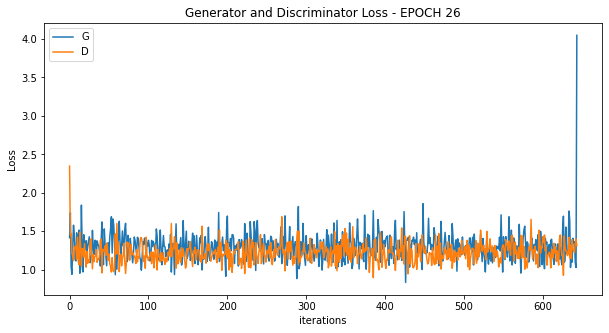

  0%|          | 0/644 [00:00<?, ?it/s]

[28/100][322/644] Loss_D: 1.4918 Loss_G: 1.3783 D(x): 0.5114 D(G(z)): 0.5036 / 0.2469
[28/100][644/644] Loss_D: 1.6738 Loss_G: 1.3363 D(x): 0.1900 D(G(z)): 0.1159 / 0.2356


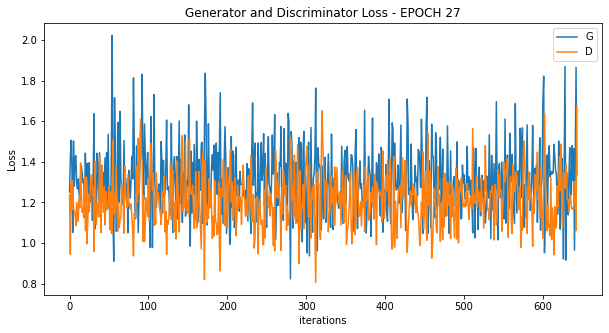

  0%|          | 0/644 [00:00<?, ?it/s]

[29/100][322/644] Loss_D: 1.1364 Loss_G: 1.3332 D(x): 0.5812 D(G(z)): 0.3729 / 0.2547
[29/100][644/644] Loss_D: 2.2802 Loss_G: 2.2573 D(x): 0.1572 D(G(z)): 0.2869 / 0.0908


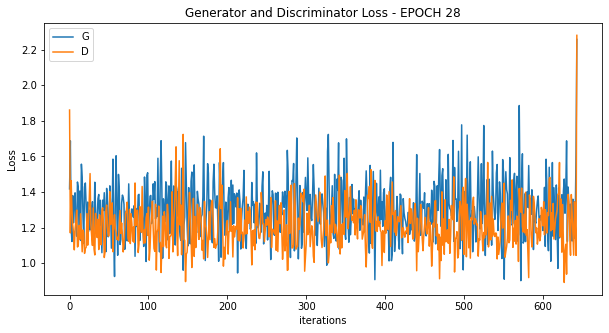

  0%|          | 0/644 [00:00<?, ?it/s]

[30/100][322/644] Loss_D: 1.6302 Loss_G: 0.9145 D(x): 0.3138 D(G(z)): 0.3560 / 0.4023
[30/100][644/644] Loss_D: 0.5784 Loss_G: 2.7596 D(x): 0.7323 D(G(z)): 0.1276 / 0.0473


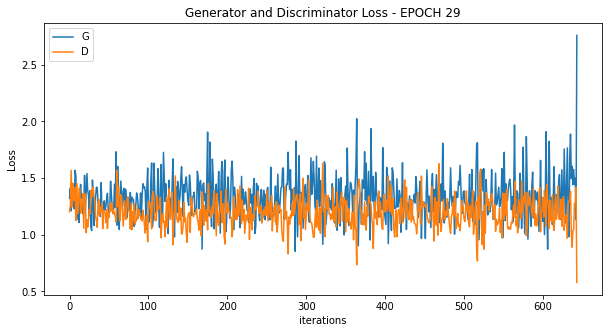

  0%|          | 0/644 [00:00<?, ?it/s]

[31/100][322/644] Loss_D: 0.8936 Loss_G: 1.6922 D(x): 0.6855 D(G(z)): 0.3350 / 0.1642
[31/100][644/644] Loss_D: 1.4210 Loss_G: 3.6018 D(x): 0.4542 D(G(z)): 0.4224 / 0.0231


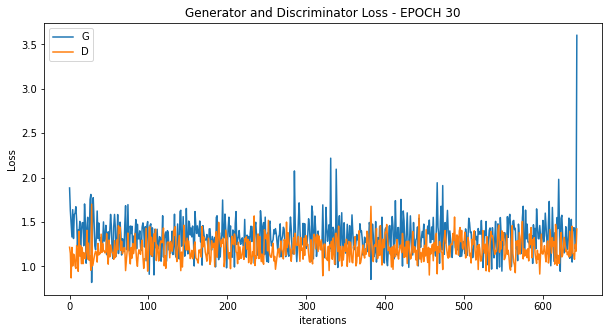

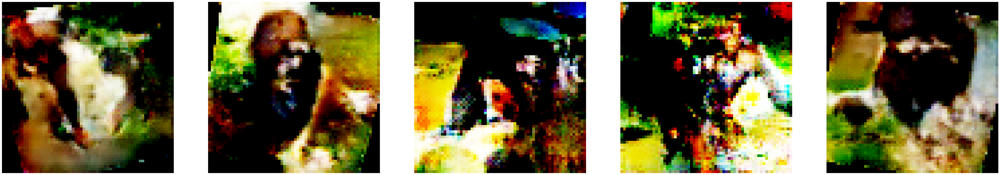

  0%|          | 0/644 [00:00<?, ?it/s]

[32/100][322/644] Loss_D: 1.0754 Loss_G: 1.7754 D(x): 0.4600 D(G(z)): 0.2030 / 0.1720
[32/100][644/644] Loss_D: 2.5666 Loss_G: 2.7343 D(x): 0.1134 D(G(z)): 0.4247 / 0.0609


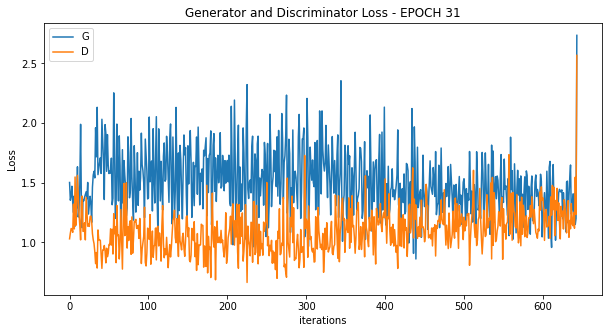

  0%|          | 0/644 [00:00<?, ?it/s]

[33/100][322/644] Loss_D: 0.9824 Loss_G: 1.5765 D(x): 0.7089 D(G(z)): 0.3796 / 0.1926
[33/100][644/644] Loss_D: 1.2237 Loss_G: 2.4163 D(x): 0.4244 D(G(z)): 0.2954 / 0.0763


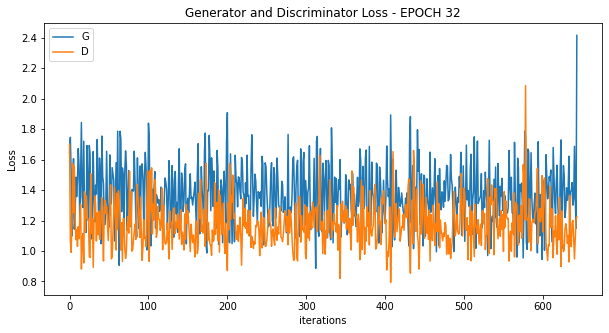

  0%|          | 0/644 [00:00<?, ?it/s]

[34/100][322/644] Loss_D: 1.3808 Loss_G: 1.1064 D(x): 0.5034 D(G(z)): 0.4171 / 0.3369
[34/100][644/644] Loss_D: 1.0722 Loss_G: 2.3855 D(x): 0.4403 D(G(z)): 0.2147 / 0.0760


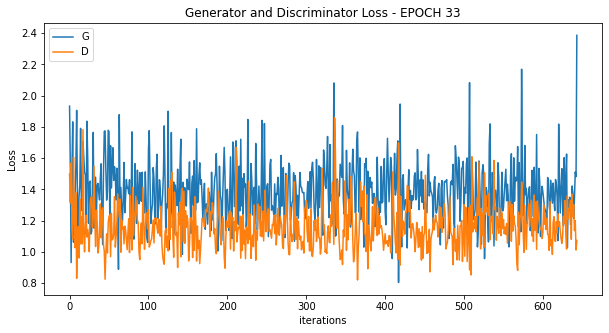

  0%|          | 0/644 [00:00<?, ?it/s]

[35/100][322/644] Loss_D: 1.1181 Loss_G: 1.5335 D(x): 0.5762 D(G(z)): 0.3756 / 0.2042
[35/100][644/644] Loss_D: 1.5382 Loss_G: 4.1244 D(x): 0.3908 D(G(z)): 0.4230 / 0.0298


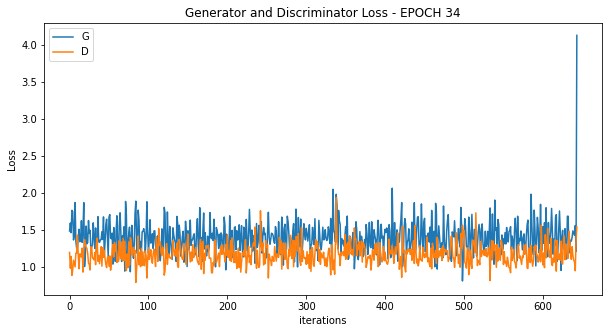

  0%|          | 0/644 [00:00<?, ?it/s]

[36/100][322/644] Loss_D: 1.3427 Loss_G: 1.1166 D(x): 0.4021 D(G(z)): 0.3194 / 0.3207
[36/100][644/644] Loss_D: 1.9736 Loss_G: 3.1726 D(x): 0.2277 D(G(z)): 0.3800 / 0.0849


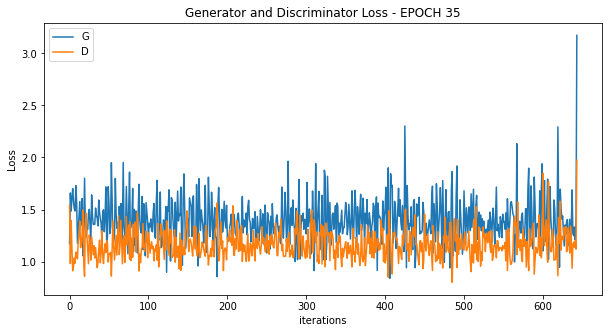

  0%|          | 0/644 [00:00<?, ?it/s]

[37/100][322/644] Loss_D: 1.0772 Loss_G: 1.4418 D(x): 0.5733 D(G(z)): 0.3310 / 0.2419
[37/100][644/644] Loss_D: 0.6494 Loss_G: 3.6652 D(x): 0.8763 D(G(z)): 0.2479 / 0.0191


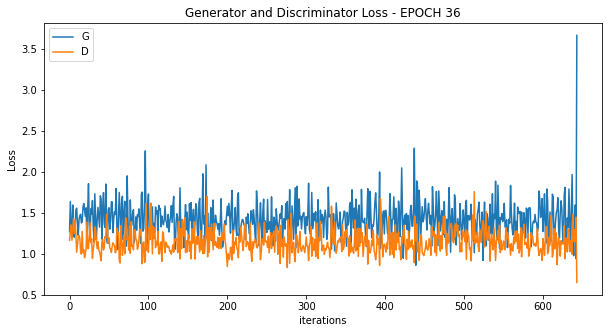

  0%|          | 0/644 [00:00<?, ?it/s]

[38/100][322/644] Loss_D: 0.9223 Loss_G: 1.6220 D(x): 0.6794 D(G(z)): 0.3261 / 0.1928
[38/100][644/644] Loss_D: 0.7378 Loss_G: 3.2181 D(x): 0.6382 D(G(z)): 0.1713 / 0.0300


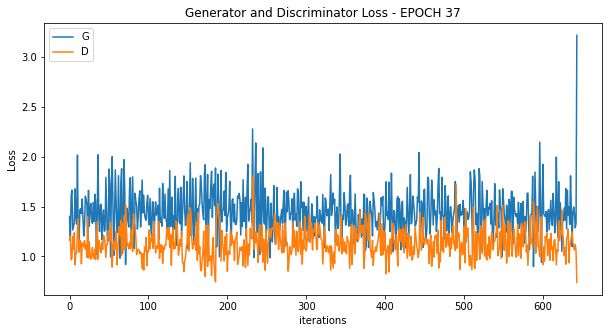

  0%|          | 0/644 [00:00<?, ?it/s]

[39/100][322/644] Loss_D: 1.0557 Loss_G: 1.7304 D(x): 0.6274 D(G(z)): 0.3677 / 0.1708
[39/100][644/644] Loss_D: 1.8630 Loss_G: 5.0142 D(x): 0.3581 D(G(z)): 0.5590 / 0.0103


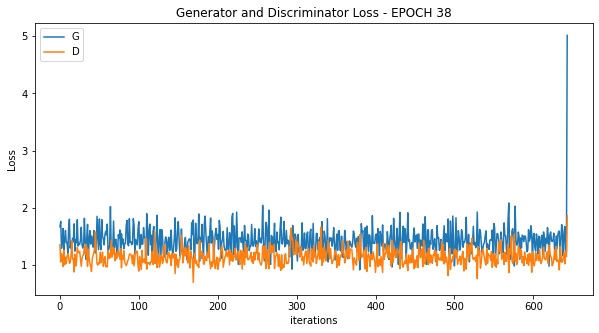

  0%|          | 0/644 [00:00<?, ?it/s]

[40/100][322/644] Loss_D: 0.9319 Loss_G: 2.2855 D(x): 0.7119 D(G(z)): 0.3449 / 0.0894
[40/100][644/644] Loss_D: 1.5435 Loss_G: 2.6246 D(x): 0.3503 D(G(z)): 0.3552 / 0.0782


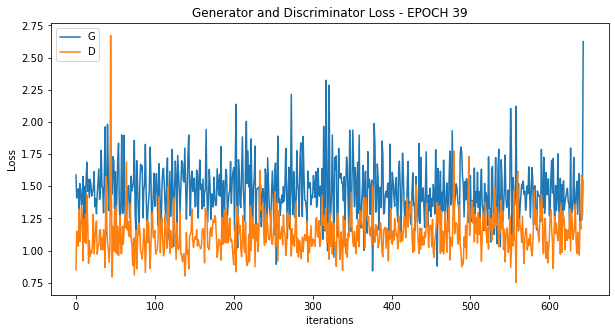

  0%|          | 0/644 [00:00<?, ?it/s]

[41/100][322/644] Loss_D: 0.9893 Loss_G: 1.5988 D(x): 0.7224 D(G(z)): 0.3995 / 0.1945
[41/100][644/644] Loss_D: 1.1691 Loss_G: 4.8611 D(x): 0.5864 D(G(z)): 0.4372 / 0.0080


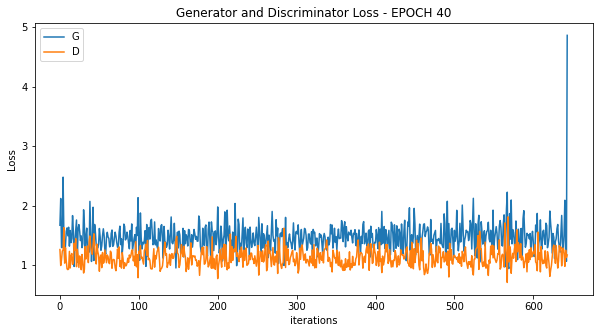

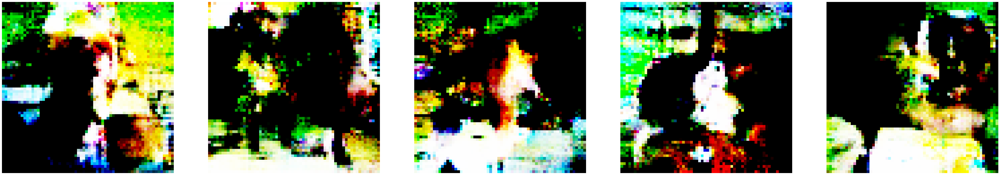

  0%|          | 0/644 [00:00<?, ?it/s]

[42/100][322/644] Loss_D: 0.9221 Loss_G: 1.5915 D(x): 0.5696 D(G(z)): 0.2438 / 0.1973
[42/100][644/644] Loss_D: 2.5396 Loss_G: 2.0048 D(x): 0.1078 D(G(z)): 0.2784 / 0.1225


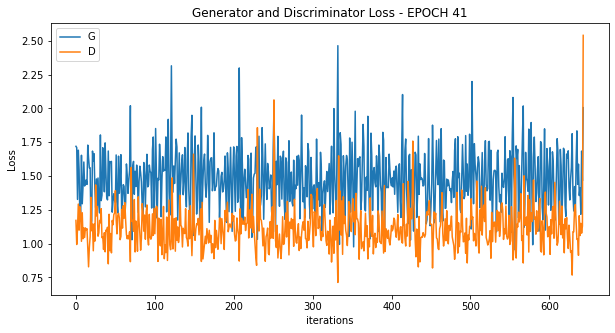

  0%|          | 0/644 [00:00<?, ?it/s]

[43/100][322/644] Loss_D: 1.3048 Loss_G: 1.5512 D(x): 0.5327 D(G(z)): 0.4228 / 0.1996
[43/100][644/644] Loss_D: 1.7486 Loss_G: 3.8959 D(x): 0.2867 D(G(z)): 0.3999 / 0.0226


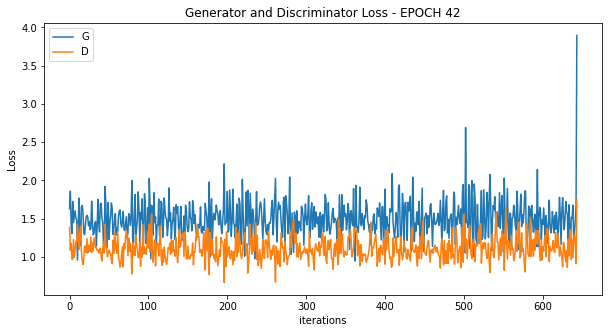

  0%|          | 0/644 [00:00<?, ?it/s]

[44/100][322/644] Loss_D: 1.2987 Loss_G: 1.7916 D(x): 0.5549 D(G(z)): 0.4207 / 0.1586
[44/100][644/644] Loss_D: 1.1275 Loss_G: 6.0926 D(x): 0.7516 D(G(z)): 0.5017 / 0.0041


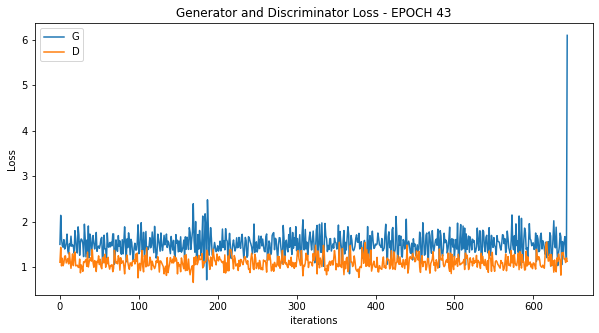

  0%|          | 0/644 [00:00<?, ?it/s]

[45/100][322/644] Loss_D: 1.1570 Loss_G: 1.5355 D(x): 0.5665 D(G(z)): 0.3624 / 0.2056
[45/100][644/644] Loss_D: 0.7259 Loss_G: 2.5208 D(x): 0.5521 D(G(z)): 0.1006 / 0.0623


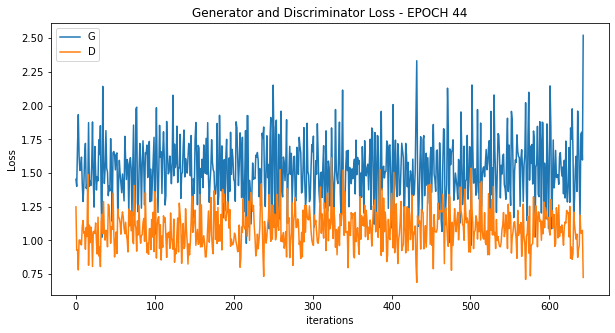

  0%|          | 0/644 [00:00<?, ?it/s]

[46/100][322/644] Loss_D: 0.9087 Loss_G: 1.8348 D(x): 0.6417 D(G(z)): 0.2871 / 0.1527
[46/100][644/644] Loss_D: 0.9781 Loss_G: 4.5481 D(x): 0.6361 D(G(z)): 0.3493 / 0.0070


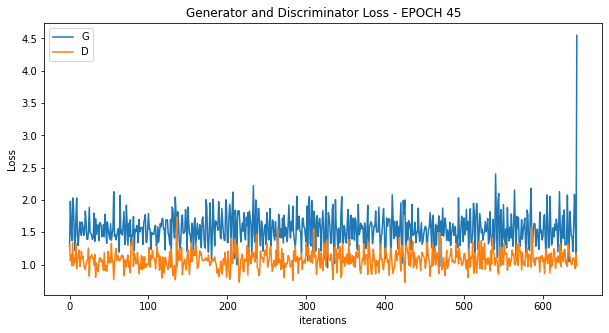

  0%|          | 0/644 [00:00<?, ?it/s]

[47/100][322/644] Loss_D: 1.0073 Loss_G: 1.8430 D(x): 0.5653 D(G(z)): 0.2706 / 0.1585
[47/100][644/644] Loss_D: 1.8420 Loss_G: 1.2959 D(x): 0.1444 D(G(z)): 0.0750 / 0.2464


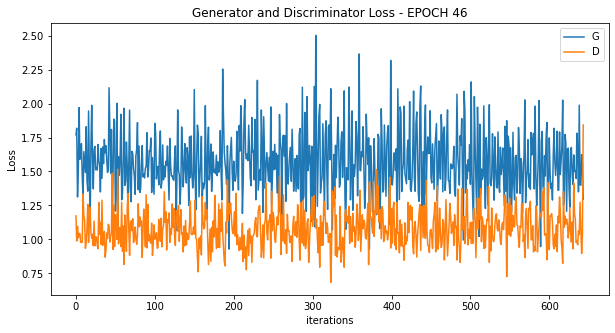

  0%|          | 0/644 [00:00<?, ?it/s]

[48/100][322/644] Loss_D: 0.8221 Loss_G: 1.6356 D(x): 0.6156 D(G(z)): 0.2152 / 0.1838
[48/100][644/644] Loss_D: 1.8380 Loss_G: 1.9880 D(x): 0.1687 D(G(z)): 0.0854 / 0.1165


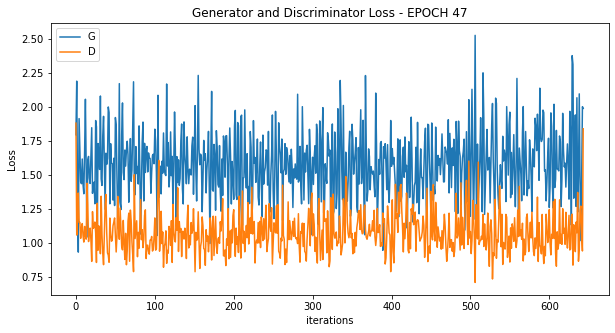

  0%|          | 0/644 [00:00<?, ?it/s]

[49/100][322/644] Loss_D: 1.0074 Loss_G: 1.8828 D(x): 0.5605 D(G(z)): 0.2602 / 0.1506
[49/100][644/644] Loss_D: 2.1472 Loss_G: 5.3502 D(x): 0.2453 D(G(z)): 0.4628 / 0.0093


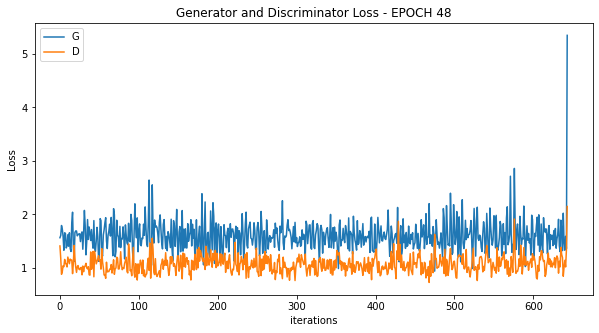

  0%|          | 0/644 [00:00<?, ?it/s]

[50/100][322/644] Loss_D: 1.2112 Loss_G: 1.5220 D(x): 0.6141 D(G(z)): 0.4333 / 0.2179
[50/100][644/644] Loss_D: 1.1238 Loss_G: 2.6500 D(x): 0.4523 D(G(z)): 0.1363 / 0.0563


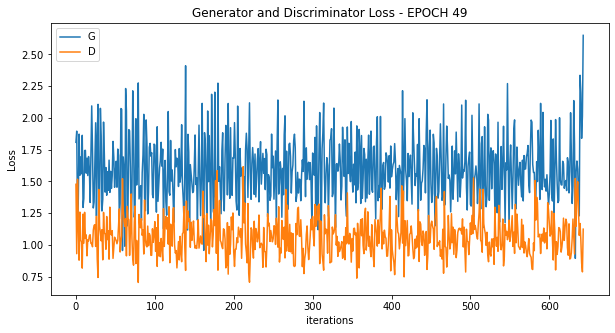

  0%|          | 0/644 [00:00<?, ?it/s]

[51/100][322/644] Loss_D: 1.2958 Loss_G: 1.0305 D(x): 0.3851 D(G(z)): 0.2605 / 0.3653
[51/100][644/644] Loss_D: 1.2263 Loss_G: 2.9860 D(x): 0.3956 D(G(z)): 0.2121 / 0.0480


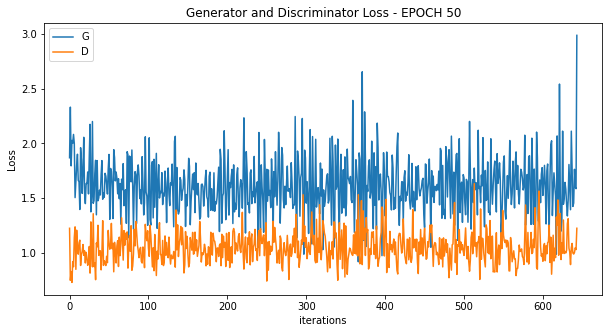

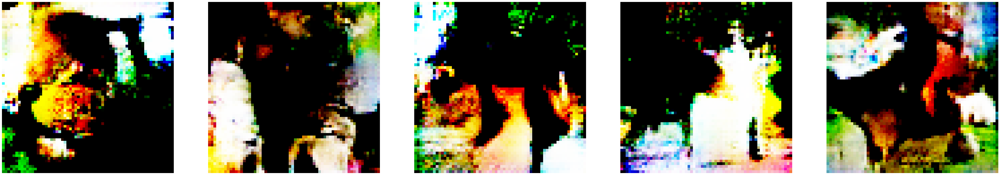

  0%|          | 0/644 [00:00<?, ?it/s]

[52/100][322/644] Loss_D: 0.7901 Loss_G: 1.7405 D(x): 0.6100 D(G(z)): 0.1682 / 0.1753
[52/100][644/644] Loss_D: 0.9660 Loss_G: 4.0150 D(x): 0.5483 D(G(z)): 0.2551 / 0.0339


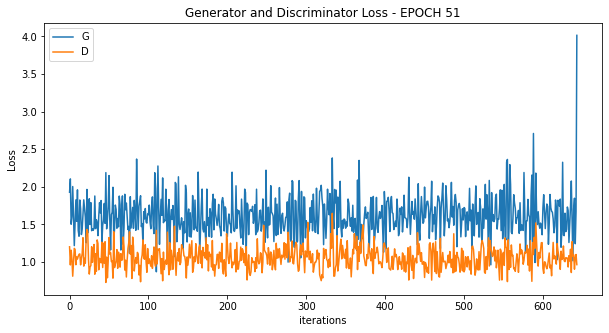

  0%|          | 0/644 [00:00<?, ?it/s]

[53/100][322/644] Loss_D: 1.0223 Loss_G: 1.6505 D(x): 0.6350 D(G(z)): 0.3434 / 0.1838
[53/100][644/644] Loss_D: 1.6467 Loss_G: 2.2204 D(x): 0.2177 D(G(z)): 0.1437 / 0.0909


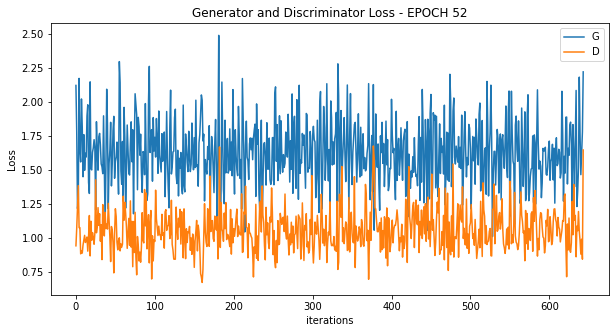

  0%|          | 0/644 [00:00<?, ?it/s]

[54/100][322/644] Loss_D: 1.1365 Loss_G: 1.3088 D(x): 0.4810 D(G(z)): 0.2383 / 0.2812
[54/100][644/644] Loss_D: 1.3950 Loss_G: 2.9716 D(x): 0.3036 D(G(z)): 0.1707 / 0.0460


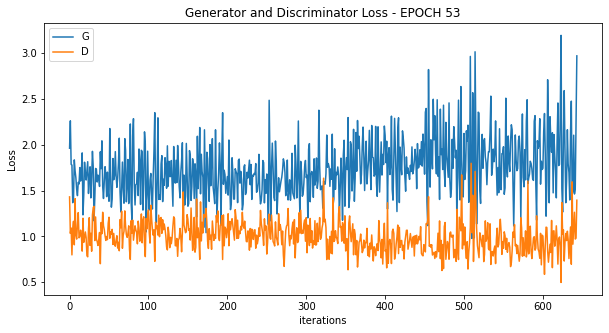

  0%|          | 0/644 [00:00<?, ?it/s]

[55/100][322/644] Loss_D: 0.8389 Loss_G: 1.8655 D(x): 0.6602 D(G(z)): 0.2081 / 0.1459
[55/100][644/644] Loss_D: 0.5056 Loss_G: 2.8718 D(x): 0.7058 D(G(z)): 0.0596 / 0.0420


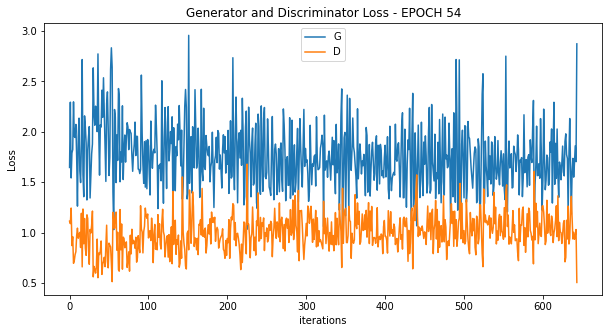

  0%|          | 0/644 [00:00<?, ?it/s]

[56/100][322/644] Loss_D: 0.9525 Loss_G: 1.8212 D(x): 0.6313 D(G(z)): 0.3009 / 0.1625
[56/100][644/644] Loss_D: 1.0103 Loss_G: 2.5503 D(x): 0.4731 D(G(z)): 0.1809 / 0.0930


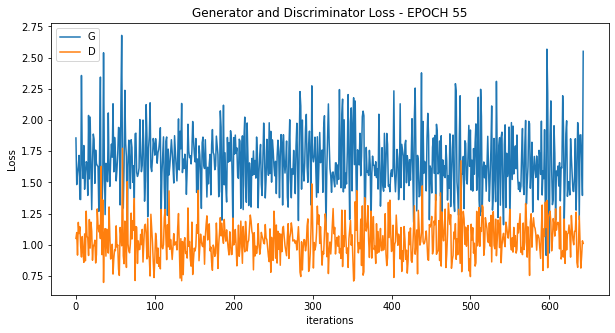

  0%|          | 0/644 [00:00<?, ?it/s]

[57/100][322/644] Loss_D: 0.9176 Loss_G: 1.6568 D(x): 0.5757 D(G(z)): 0.2244 / 0.1960
[57/100][644/644] Loss_D: 1.5236 Loss_G: 1.9188 D(x): 0.2326 D(G(z)): 0.1115 / 0.1241


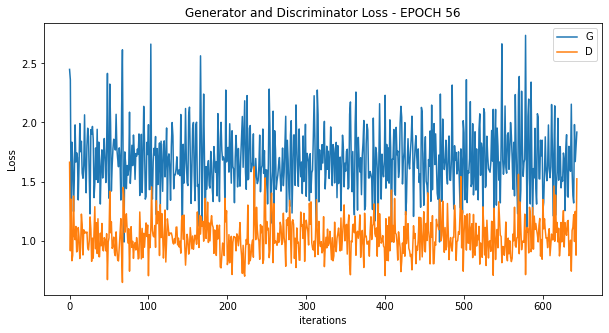

  0%|          | 0/644 [00:00<?, ?it/s]

[58/100][322/644] Loss_D: 1.2708 Loss_G: 1.3505 D(x): 0.3831 D(G(z)): 0.1788 / 0.2625
[58/100][644/644] Loss_D: 1.7412 Loss_G: 4.0842 D(x): 0.2370 D(G(z)): 0.2336 / 0.0349


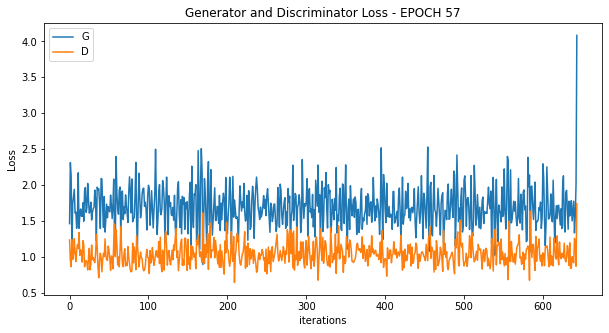

  0%|          | 0/644 [00:00<?, ?it/s]

[59/100][322/644] Loss_D: 0.8198 Loss_G: 1.8365 D(x): 0.5613 D(G(z)): 0.1498 / 0.1583
[59/100][644/644] Loss_D: 0.9933 Loss_G: 2.2866 D(x): 0.4080 D(G(z)): 0.0341 / 0.0800


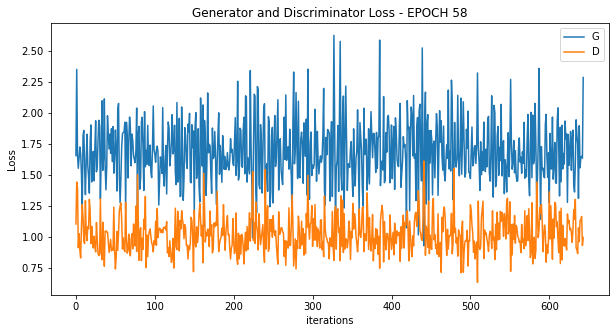

  0%|          | 0/644 [00:00<?, ?it/s]

[60/100][322/644] Loss_D: 1.0931 Loss_G: 1.8640 D(x): 0.4218 D(G(z)): 0.1082 / 0.1650
[60/100][644/644] Loss_D: 1.5891 Loss_G: 3.8781 D(x): 0.2732 D(G(z)): 0.2936 / 0.0707


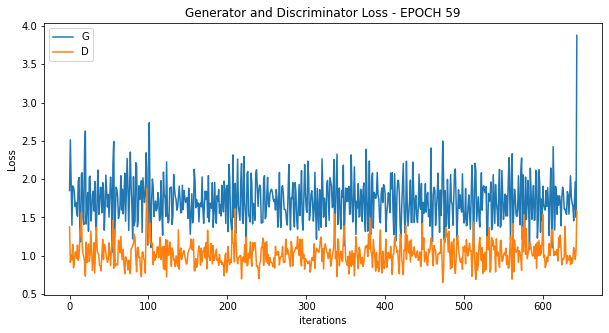

  0%|          | 0/644 [00:00<?, ?it/s]

[61/100][322/644] Loss_D: 0.9218 Loss_G: 1.6048 D(x): 0.5578 D(G(z)): 0.2065 / 0.1924
[61/100][644/644] Loss_D: 1.5378 Loss_G: 1.4612 D(x): 0.2195 D(G(z)): 0.0888 / 0.2125


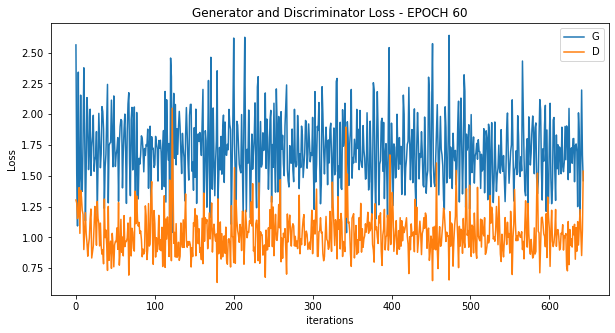

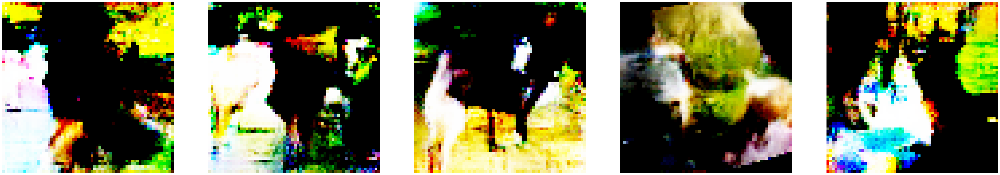

  0%|          | 0/644 [00:00<?, ?it/s]

[62/100][322/644] Loss_D: 0.8733 Loss_G: 1.3493 D(x): 0.5731 D(G(z)): 0.1827 / 0.2516
[62/100][644/644] Loss_D: 1.2013 Loss_G: 1.9411 D(x): 0.3879 D(G(z)): 0.1911 / 0.1227


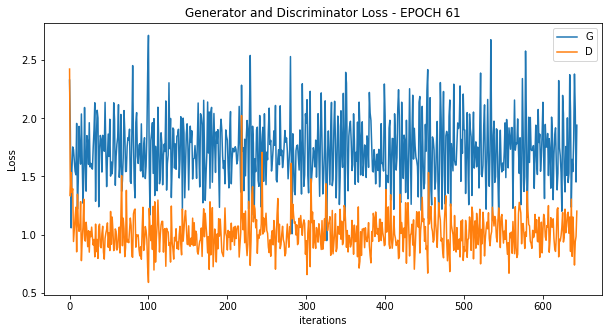

  0%|          | 0/644 [00:00<?, ?it/s]

[63/100][322/644] Loss_D: 0.9736 Loss_G: 1.5430 D(x): 0.6016 D(G(z)): 0.3057 / 0.2037
[63/100][644/644] Loss_D: 0.9186 Loss_G: 2.5266 D(x): 0.4336 D(G(z)): 0.0670 / 0.0645


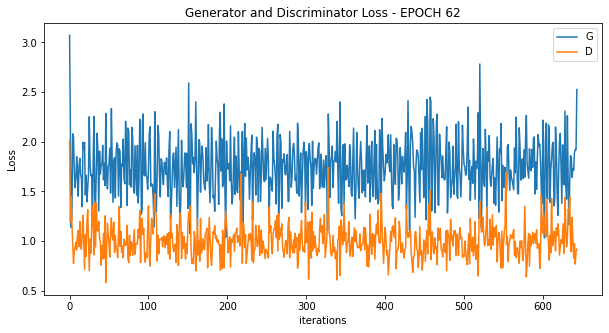

  0%|          | 0/644 [00:00<?, ?it/s]

[64/100][322/644] Loss_D: 1.0544 Loss_G: 1.6598 D(x): 0.5354 D(G(z)): 0.2261 / 0.1972
[64/100][644/644] Loss_D: 0.7390 Loss_G: 3.2823 D(x): 0.5142 D(G(z)): 0.0425 / 0.0268


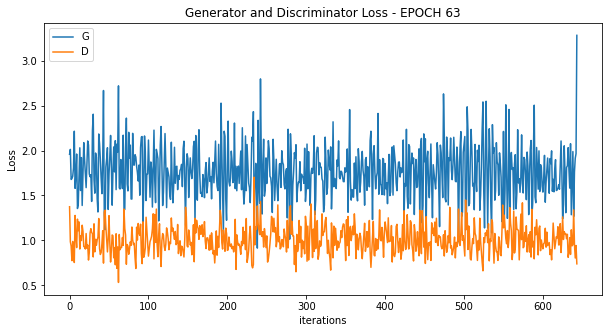

  0%|          | 0/644 [00:00<?, ?it/s]

[65/100][322/644] Loss_D: 0.9997 Loss_G: 1.5943 D(x): 0.4910 D(G(z)): 0.1678 / 0.2125
[65/100][644/644] Loss_D: 1.4589 Loss_G: 2.4797 D(x): 0.3685 D(G(z)): 0.1453 / 0.0896


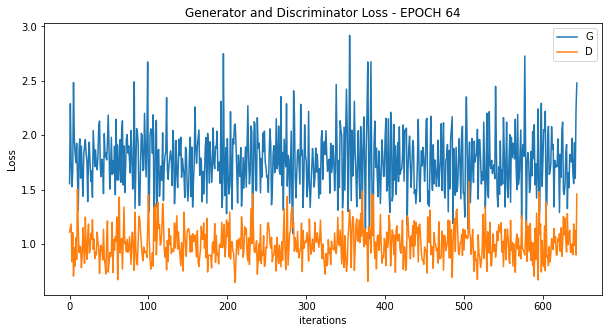

  0%|          | 0/644 [00:00<?, ?it/s]

[66/100][322/644] Loss_D: 0.9159 Loss_G: 1.8281 D(x): 0.6372 D(G(z)): 0.2594 / 0.1656
[66/100][644/644] Loss_D: 0.6121 Loss_G: 4.3978 D(x): 0.7565 D(G(z)): 0.1189 / 0.0076


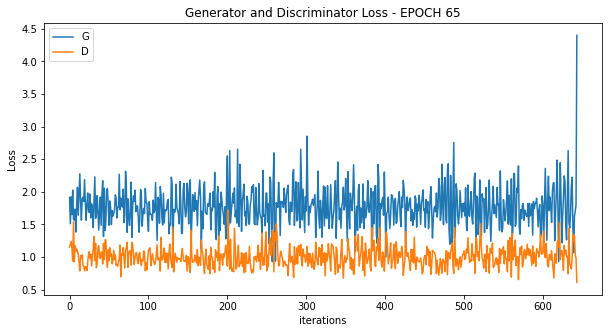

  0%|          | 0/644 [00:00<?, ?it/s]

[67/100][322/644] Loss_D: 0.9610 Loss_G: 1.8810 D(x): 0.6545 D(G(z)): 0.3199 / 0.1534
[67/100][644/644] Loss_D: 0.9178 Loss_G: 2.8918 D(x): 0.4891 D(G(z)): 0.0574 / 0.0431


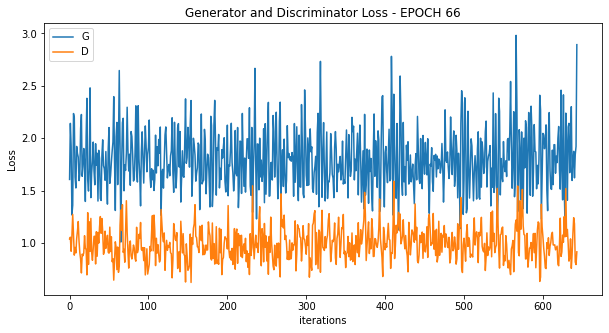

  0%|          | 0/644 [00:00<?, ?it/s]

[68/100][322/644] Loss_D: 1.1421 Loss_G: 1.8421 D(x): 0.6647 D(G(z)): 0.3904 / 0.1609
[68/100][644/644] Loss_D: 1.0734 Loss_G: 4.7918 D(x): 0.4515 D(G(z)): 0.2331 / 0.0111


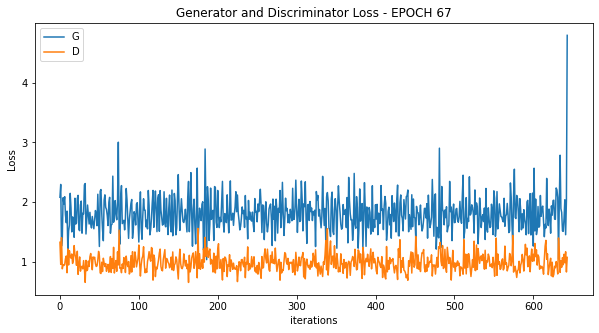

  0%|          | 0/644 [00:00<?, ?it/s]

[69/100][322/644] Loss_D: 0.9398 Loss_G: 2.0300 D(x): 0.7201 D(G(z)): 0.3452 / 0.1278
[69/100][644/644] Loss_D: 0.9333 Loss_G: 2.7886 D(x): 0.4693 D(G(z)): 0.1184 / 0.0576


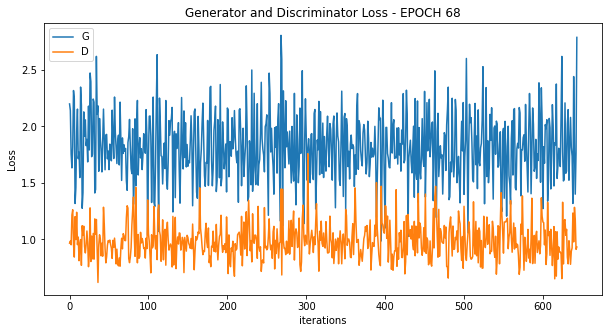

  0%|          | 0/644 [00:00<?, ?it/s]

[70/100][322/644] Loss_D: 0.7943 Loss_G: 2.2241 D(x): 0.6885 D(G(z)): 0.2178 / 0.1067
[70/100][644/644] Loss_D: 0.8533 Loss_G: 5.8501 D(x): 0.7272 D(G(z)): 0.3158 / 0.0017


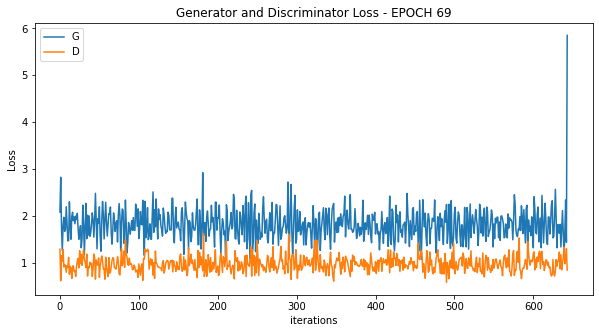

  0%|          | 0/644 [00:00<?, ?it/s]

[71/100][322/644] Loss_D: 0.9971 Loss_G: 1.6661 D(x): 0.6052 D(G(z)): 0.2737 / 0.1800
[71/100][644/644] Loss_D: 1.1645 Loss_G: 3.2235 D(x): 0.3800 D(G(z)): 0.1388 / 0.0487


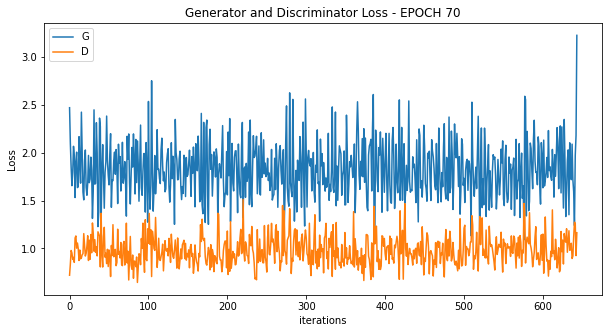

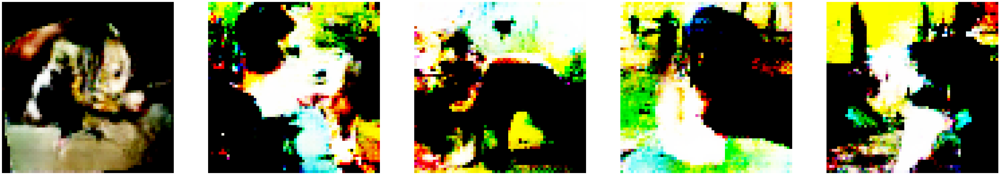

  0%|          | 0/644 [00:00<?, ?it/s]

[72/100][322/644] Loss_D: 1.0384 Loss_G: 1.7530 D(x): 0.4612 D(G(z)): 0.1277 / 0.1985
[72/100][644/644] Loss_D: 0.8802 Loss_G: 3.4958 D(x): 0.4736 D(G(z)): 0.1156 / 0.0219


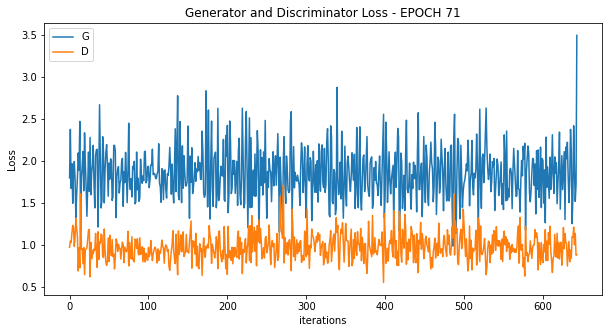

  0%|          | 0/644 [00:00<?, ?it/s]

[73/100][322/644] Loss_D: 0.9725 Loss_G: 1.7182 D(x): 0.5289 D(G(z)): 0.2040 / 0.1938
[73/100][644/644] Loss_D: 2.7203 Loss_G: 4.2230 D(x): 0.0984 D(G(z)): 0.2901 / 0.0442


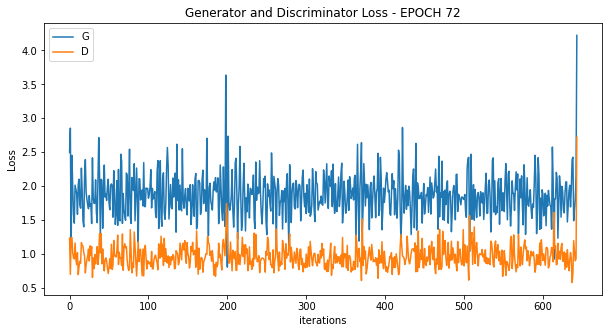

  0%|          | 0/644 [00:00<?, ?it/s]

[74/100][322/644] Loss_D: 0.9327 Loss_G: 2.1782 D(x): 0.6326 D(G(z)): 0.2785 / 0.1199
[74/100][644/644] Loss_D: 1.0300 Loss_G: 2.2198 D(x): 0.3919 D(G(z)): 0.0986 / 0.0882


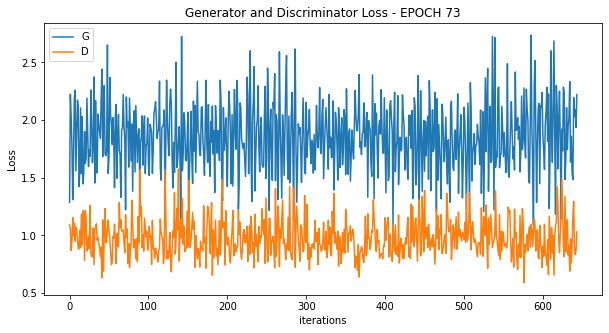

  0%|          | 0/644 [00:00<?, ?it/s]

[75/100][322/644] Loss_D: 0.8884 Loss_G: 1.9429 D(x): 0.7023 D(G(z)): 0.2965 / 0.1551
[75/100][644/644] Loss_D: 1.0414 Loss_G: 6.8077 D(x): 0.7081 D(G(z)): 0.4064 / 0.0006


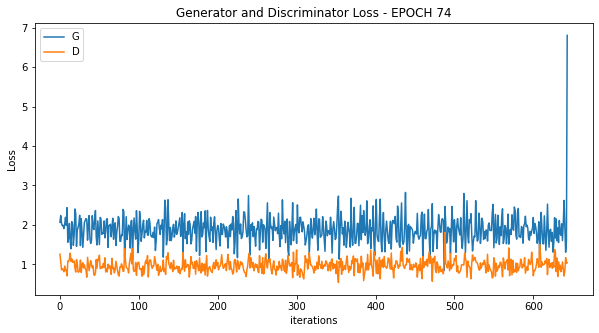

  0%|          | 0/644 [00:00<?, ?it/s]

[76/100][322/644] Loss_D: 0.8067 Loss_G: 2.5181 D(x): 0.8386 D(G(z)): 0.3137 / 0.0802
[76/100][644/644] Loss_D: 1.0819 Loss_G: 1.9483 D(x): 0.4428 D(G(z)): 0.0879 / 0.1179


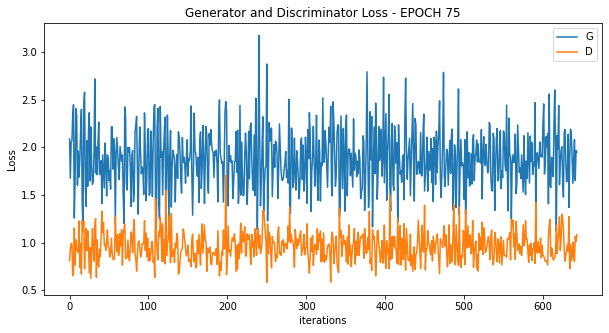

  0%|          | 0/644 [00:00<?, ?it/s]

[77/100][322/644] Loss_D: 0.8946 Loss_G: 1.7494 D(x): 0.5911 D(G(z)): 0.2236 / 0.1659
[77/100][644/644] Loss_D: 1.3471 Loss_G: 3.6743 D(x): 0.3104 D(G(z)): 0.2016 / 0.0188


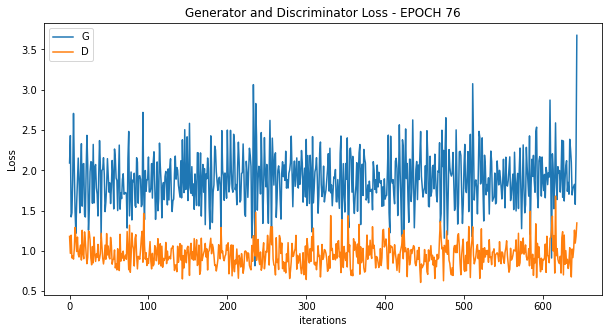

  0%|          | 0/644 [00:00<?, ?it/s]

[78/100][322/644] Loss_D: 1.1069 Loss_G: 1.7593 D(x): 0.5515 D(G(z)): 0.3069 / 0.1788
[78/100][644/644] Loss_D: 0.7197 Loss_G: 3.8808 D(x): 0.6668 D(G(z)): 0.1818 / 0.0163


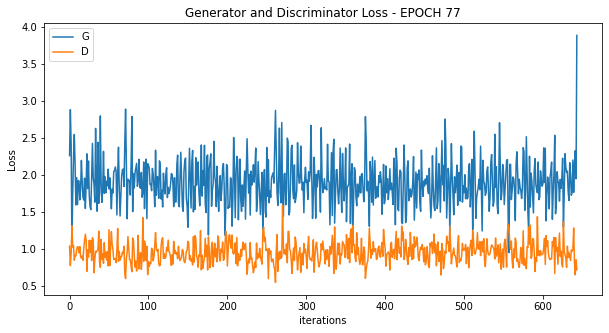

  0%|          | 0/644 [00:00<?, ?it/s]

[79/100][322/644] Loss_D: 0.8383 Loss_G: 1.9035 D(x): 0.5909 D(G(z)): 0.1928 / 0.1535
[79/100][644/644] Loss_D: 0.9700 Loss_G: 3.3116 D(x): 0.4581 D(G(z)): 0.1348 / 0.0396


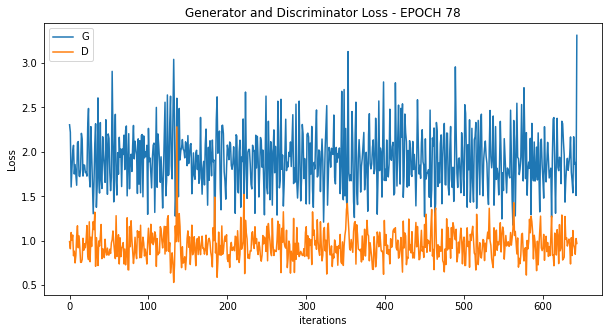

  0%|          | 0/644 [00:00<?, ?it/s]

[80/100][322/644] Loss_D: 1.1674 Loss_G: 1.3406 D(x): 0.4718 D(G(z)): 0.2529 / 0.2563
[80/100][644/644] Loss_D: 0.5250 Loss_G: 3.3895 D(x): 0.7611 D(G(z)): 0.0547 / 0.0268


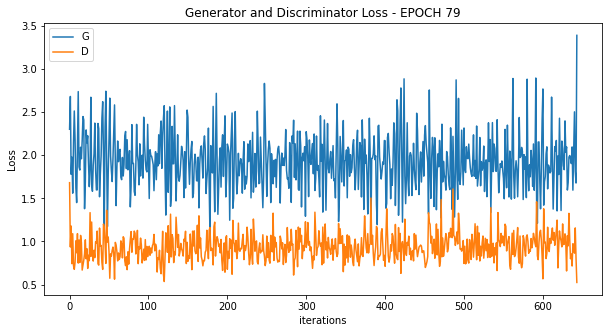

  0%|          | 0/644 [00:00<?, ?it/s]

[81/100][322/644] Loss_D: 0.9052 Loss_G: 1.5888 D(x): 0.5668 D(G(z)): 0.1618 / 0.2232
[81/100][644/644] Loss_D: 1.3573 Loss_G: 8.9119 D(x): 0.6330 D(G(z)): 0.3947 / 0.0023


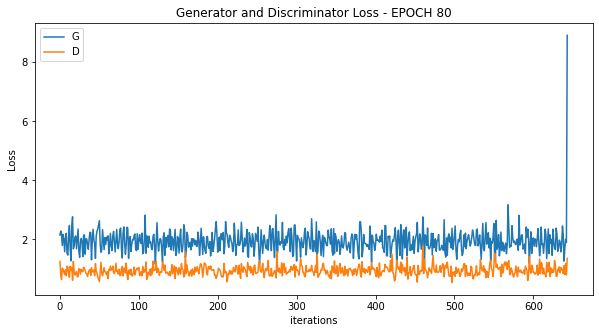

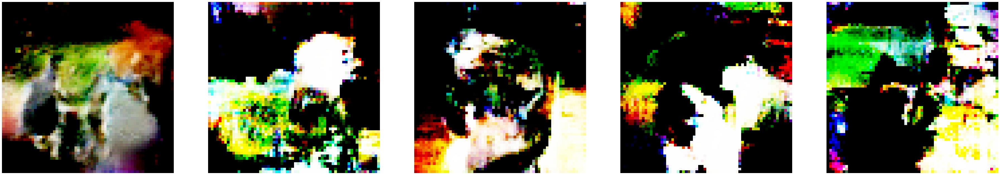

  0%|          | 0/644 [00:00<?, ?it/s]

[82/100][322/644] Loss_D: 0.9942 Loss_G: 1.7826 D(x): 0.6425 D(G(z)): 0.3086 / 0.1917
[82/100][644/644] Loss_D: 0.7331 Loss_G: 6.0847 D(x): 0.9666 D(G(z)): 0.2556 / 0.0032


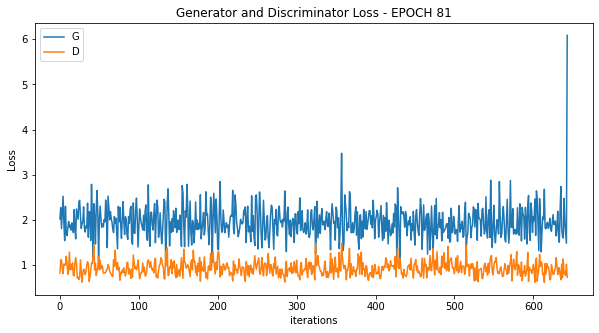

  0%|          | 0/644 [00:00<?, ?it/s]

[83/100][322/644] Loss_D: 0.8570 Loss_G: 2.4275 D(x): 0.8402 D(G(z)): 0.3451 / 0.0806
[83/100][644/644] Loss_D: 1.5526 Loss_G: 7.5532 D(x): 0.4544 D(G(z)): 0.4267 / 0.0027


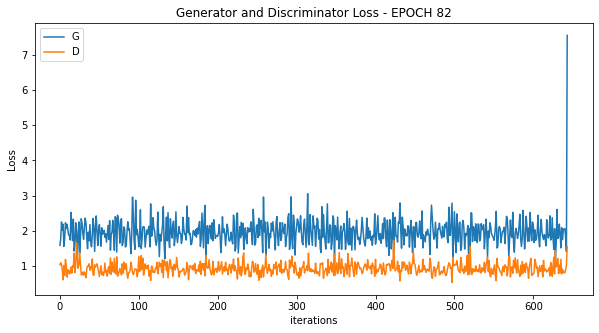

  0%|          | 0/644 [00:00<?, ?it/s]

[84/100][322/644] Loss_D: 1.0181 Loss_G: 2.2877 D(x): 0.5624 D(G(z)): 0.2319 / 0.1110
[84/100][644/644] Loss_D: 0.7929 Loss_G: 3.1287 D(x): 0.6158 D(G(z)): 0.0758 / 0.0323


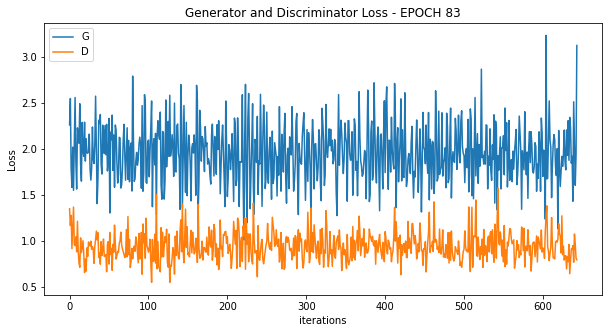

  0%|          | 0/644 [00:00<?, ?it/s]

[85/100][322/644] Loss_D: 1.1659 Loss_G: 2.2538 D(x): 0.8513 D(G(z)): 0.4354 / 0.1103
[85/100][644/644] Loss_D: 1.8738 Loss_G: 2.7919 D(x): 0.1656 D(G(z)): 0.1858 / 0.0819


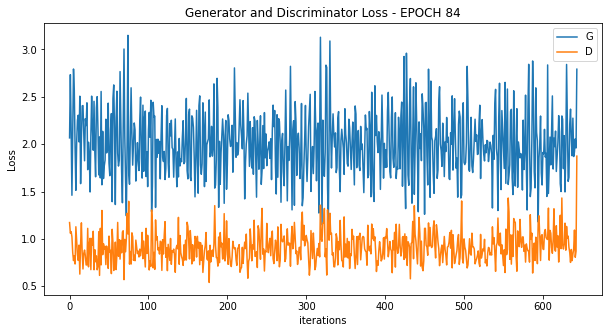

  0%|          | 0/644 [00:00<?, ?it/s]

[86/100][322/644] Loss_D: 0.7682 Loss_G: 1.9164 D(x): 0.6933 D(G(z)): 0.2390 / 0.1387
[86/100][644/644] Loss_D: 0.7960 Loss_G: 5.7185 D(x): 0.6203 D(G(z)): 0.1727 / 0.0113


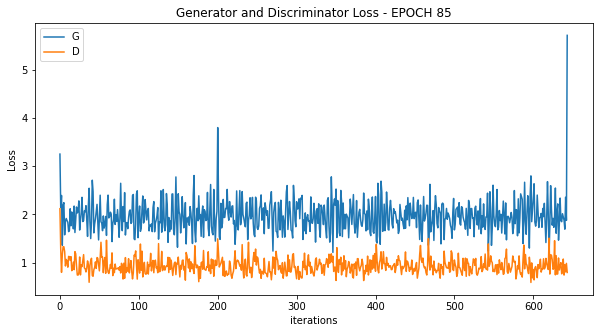

  0%|          | 0/644 [00:00<?, ?it/s]

[87/100][322/644] Loss_D: 0.9733 Loss_G: 1.9107 D(x): 0.5550 D(G(z)): 0.1986 / 0.1632
[87/100][644/644] Loss_D: 0.5247 Loss_G: 4.2417 D(x): 0.7676 D(G(z)): 0.1174 / 0.0101


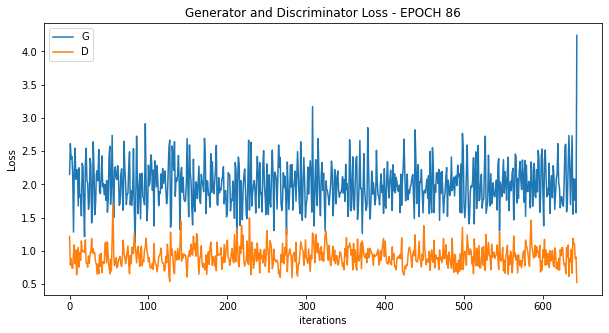

  0%|          | 0/644 [00:00<?, ?it/s]

[88/100][322/644] Loss_D: 1.0489 Loss_G: 1.6395 D(x): 0.4486 D(G(z)): 0.1425 / 0.2159
[88/100][644/644] Loss_D: 1.3435 Loss_G: 2.2734 D(x): 0.2776 D(G(z)): 0.0692 / 0.0856


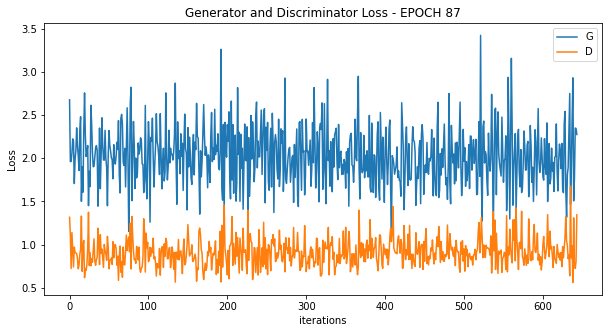

  0%|          | 0/644 [00:00<?, ?it/s]

[89/100][322/644] Loss_D: 0.8818 Loss_G: 1.6059 D(x): 0.5931 D(G(z)): 0.1904 / 0.2058
[89/100][644/644] Loss_D: 0.6563 Loss_G: 7.4621 D(x): 0.9493 D(G(z)): 0.2253 / 0.0018


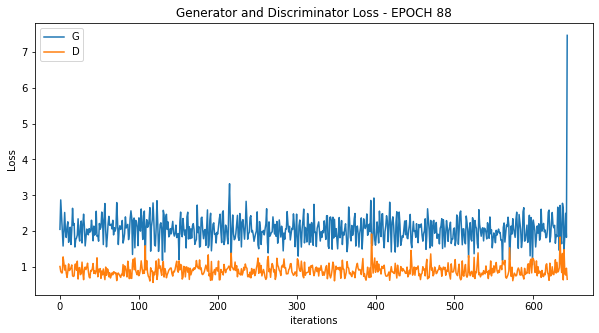

  0%|          | 0/644 [00:00<?, ?it/s]

[90/100][322/644] Loss_D: 0.9226 Loss_G: 2.0236 D(x): 0.6542 D(G(z)): 0.2725 / 0.1415
[90/100][644/644] Loss_D: 0.9177 Loss_G: 4.9350 D(x): 0.5163 D(G(z)): 0.2021 / 0.0148


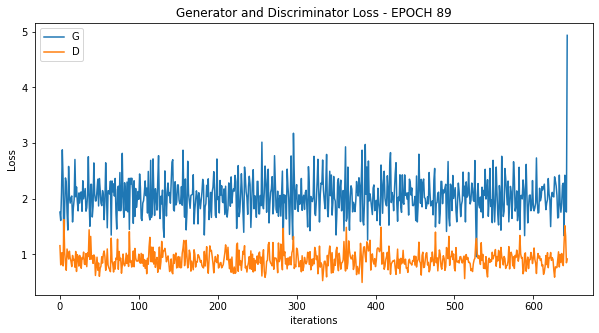

  0%|          | 0/644 [00:00<?, ?it/s]

[91/100][322/644] Loss_D: 1.0163 Loss_G: 1.6266 D(x): 0.6180 D(G(z)): 0.2609 / 0.1958
[91/100][644/644] Loss_D: 0.8502 Loss_G: 3.9191 D(x): 0.5568 D(G(z)): 0.1113 / 0.0289


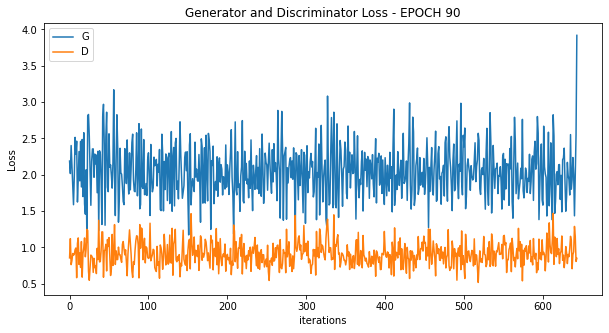

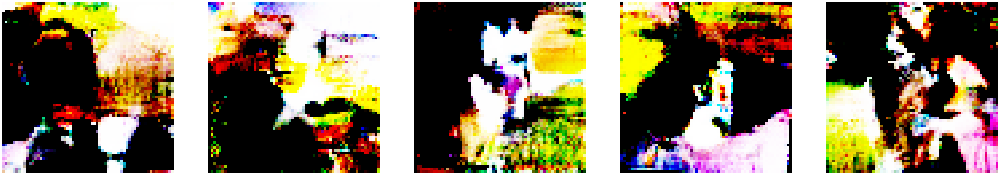

  0%|          | 0/644 [00:00<?, ?it/s]

[92/100][322/644] Loss_D: 0.9446 Loss_G: 2.0591 D(x): 0.5441 D(G(z)): 0.1721 / 0.1343
[92/100][644/644] Loss_D: 0.6106 Loss_G: 2.7586 D(x): 0.6570 D(G(z)): 0.0942 / 0.0483


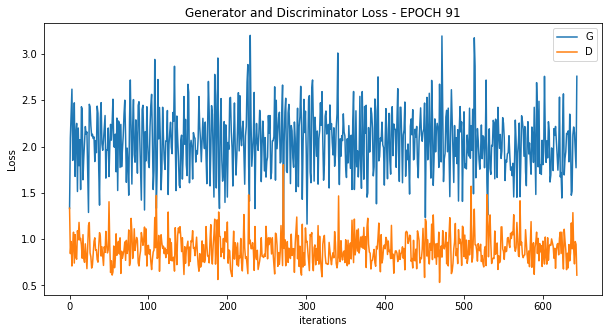

  0%|          | 0/644 [00:00<?, ?it/s]

[93/100][322/644] Loss_D: 0.8210 Loss_G: 2.3584 D(x): 0.7625 D(G(z)): 0.2860 / 0.1005
[93/100][644/644] Loss_D: 1.1104 Loss_G: 2.6336 D(x): 0.3925 D(G(z)): 0.0600 / 0.0577


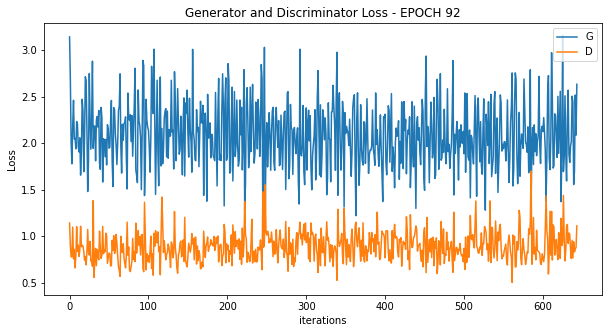

  0%|          | 0/644 [00:00<?, ?it/s]

[94/100][322/644] Loss_D: 1.0464 Loss_G: 2.3409 D(x): 0.5880 D(G(z)): 0.2461 / 0.1135
[94/100][644/644] Loss_D: 0.7013 Loss_G: 3.3391 D(x): 0.6170 D(G(z)): 0.0440 / 0.0246


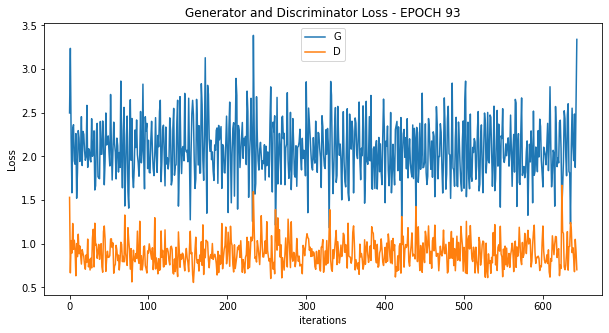

  0%|          | 0/644 [00:00<?, ?it/s]

[95/100][322/644] Loss_D: 0.6092 Loss_G: 2.4814 D(x): 0.7189 D(G(z)): 0.1130 / 0.0820
[95/100][644/644] Loss_D: 0.6026 Loss_G: 6.3105 D(x): 0.8883 D(G(z)): 0.2193 / 0.0034


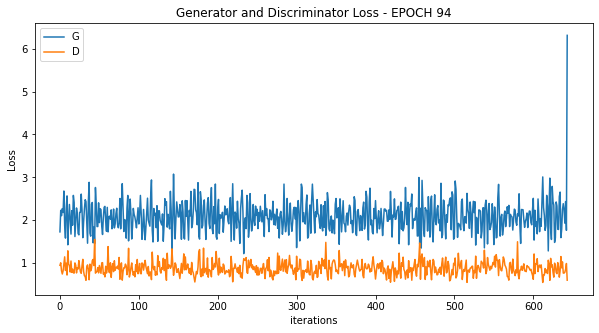

  0%|          | 0/644 [00:00<?, ?it/s]

[96/100][322/644] Loss_D: 0.8105 Loss_G: 2.4611 D(x): 0.6956 D(G(z)): 0.2297 / 0.0865
[96/100][644/644] Loss_D: 1.5392 Loss_G: 8.1537 D(x): 0.5552 D(G(z)): 0.3988 / 0.0014


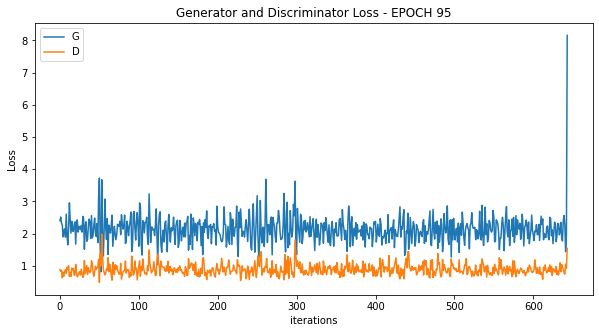

  0%|          | 0/644 [00:00<?, ?it/s]

[97/100][322/644] Loss_D: 1.0980 Loss_G: 1.3756 D(x): 0.5817 D(G(z)): 0.3191 / 0.2694
[97/100][644/644] Loss_D: 0.6241 Loss_G: 4.1356 D(x): 0.7173 D(G(z)): 0.1515 / 0.0140


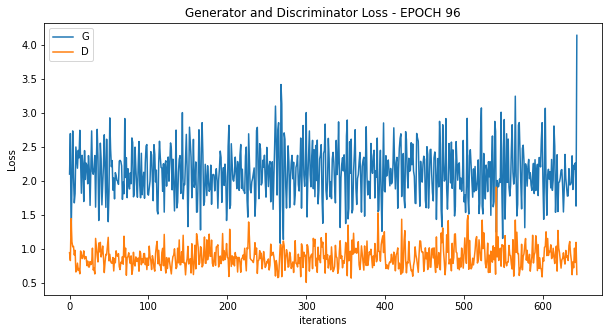

  0%|          | 0/644 [00:00<?, ?it/s]

[98/100][322/644] Loss_D: 0.7480 Loss_G: 2.5920 D(x): 0.8107 D(G(z)): 0.2708 / 0.0810
[98/100][644/644] Loss_D: 1.9940 Loss_G: 1.1990 D(x): 0.1160 D(G(z)): 0.0389 / 0.3288


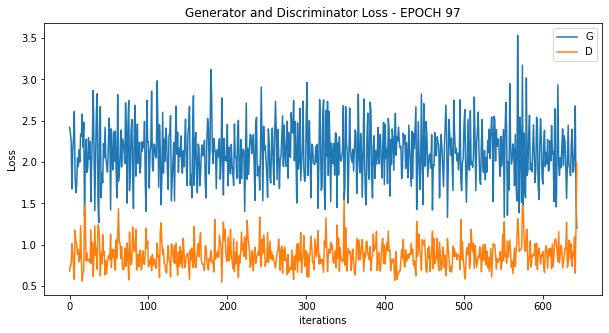

  0%|          | 0/644 [00:00<?, ?it/s]

[99/100][322/644] Loss_D: 0.9250 Loss_G: 1.6440 D(x): 0.5364 D(G(z)): 0.1371 / 0.1982
[99/100][644/644] Loss_D: 0.5786 Loss_G: 4.1663 D(x): 0.7596 D(G(z)): 0.1380 / 0.0137


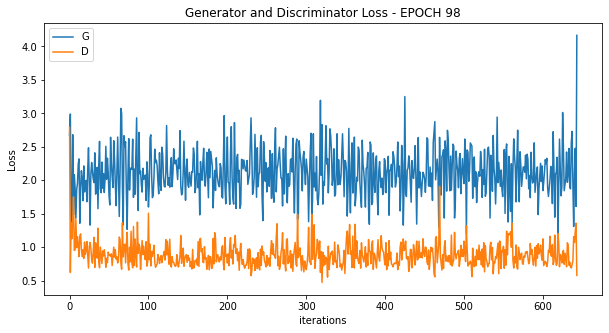

  0%|          | 0/644 [00:00<?, ?it/s]

[100/100][322/644] Loss_D: 0.7810 Loss_G: 2.5924 D(x): 0.8311 D(G(z)): 0.2908 / 0.0797
[100/100][644/644] Loss_D: 0.8824 Loss_G: 3.7008 D(x): 0.5080 D(G(z)): 0.1405 / 0.0511


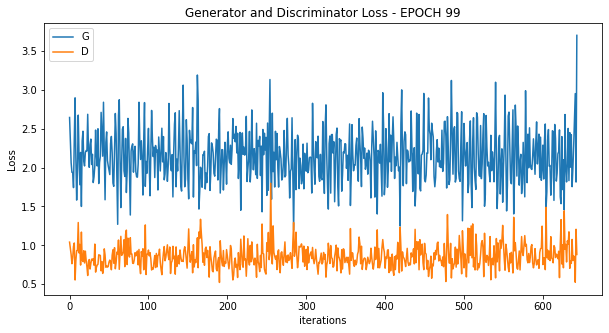

In [20]:
for epoch in range(epochs):
    start = time.time()
    for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
        netD.zero_grad()
        real_images = real_images.to(device)
        batch_size = real_images.size(0)
        labels = torch.full((batch_size, 1), real_label, device=device)

        output = netD(real_images)
        errD_real = criterion(output, labels)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(batch_size, nz, 1, 1, device=device)
        fake = netG(noise)
        labels.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, labels)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        labels.fill_(real_label)  
        output = netD(fake)
        errG = criterion(output, labels)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        if (ii+1) % (len(train_loader)//2) == 0:
            print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                  % (epoch + 1, epochs, ii+1, len(train_loader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
    plot_loss (G_losses, D_losses, epoch)
    G_losses = []
    D_losses = []
    if epoch % 10 == 0:
        show_generated_img()

    epoch_time.append(time.time()- start)

Prikaz slika generisanih na osnovu prethodno istreniranog modela.

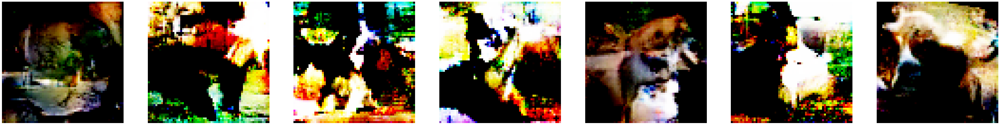

In [26]:
show_generated_img(7)